# **Projet : Captioning d'images avec Deep Learning**

### Groupe : 02
#### Présenté par :
- Membre 1 : BABACI Yacine
- Membre 2 : ALIZOUAOUI Zakaria
- Membre 3 : MAHDJOUB Ali 

# **Introduction Générale**
2. Pipeline du Livrable 3
Structure Globale :

Prétraitement des Images :

Redimensionnement et normalisation des images.
Extraction des caractéristiques visuelles via un modèle InceptionV3 préentraîné.
Prétraitement des Textes :

Nettoyage des légendes.
Conversion des phrases en séquences numériques (tokenisation).
Modèle CNN-RNN :

Encodeur (CNN) : Extraction des caractéristiques des images.
Mécanisme d’Attention : Cible les zones importantes de l’image pour chaque mot généré.
Décodeur (RNN) : Génération des mots pour former une phrase descriptive.
Entraînement et Évaluation :

Entraînement sur un dataset contenant 30 000 images.
Évaluation avec les métriques Accuracy et BLEU Score.
Visualisation des prédictions avec des cartes d’attention.
2. Pipeline du Livrable 3
Structure Globale :

Prétraitement des Images :

Redimensionnement et normalisation des images.
Extraction des caractéristiques visuelles via un modèle InceptionV3 préentraîné.
Prétraitement des Textes :

Nettoyage des légendes.
Conversion des phrases en séquences numériques (tokenisation).
Modèle CNN-RNN :

Encodeur (CNN) : Extraction des caractéristiques des images.
Mécanisme d’Attention : Cible les zones importantes de l’image pour chaque mot généré.
Décodeur (RNN) : Génération des mots pour former une phrase descriptive.
Entraînement et Évaluation :

Entraînement sur un dataset contenant 30 000 images.
Évaluation avec les métriques Accuracy et BLEU Score.
Visualisation des prédictions avec des cartes d’attention.

## Contexte du Projet
Ce projet a pour objectif de développer un système automatisé capable de générer des légendes descriptives pour des images. Il repose sur un pipeline complet comprenant :
1. **Classification Binaire** : Identifier les images pertinentes (Livrable 1).
2. **Traitement d’Images** : Débruitage et amélioration des images via des auto-encodeurs (Livrable 2).
3. **Captioning** : Génération de légendes grâce à des architectures CNN et RNN avec attention (Livrable 3).

## Objectifs :
- Automatiser l’identification et le traitement des images.
- Générer des descriptions précises pour les images pertinentes.
- Évaluer les performances à l’aide de métriques standards (Accuracy, BLEU).
- Visualiser les résultats pour interpréter le comportement du modèle.



## **Livrable 3 : Captioning d’Images**

Voici une description complète et détaillée du livrable 3 incluant des paragraphes explicatifs, des résultats, des interprétations, ainsi que le pipeline et l’architecture.

### 1. Contexte et Objectif
Contexte : Le captioning d’images est une tâche importante dans le domaine du traitement d’images et du traitement du langage naturel. Elle consiste à générer une description textuelle d’une image, ce qui est utile dans des applications comme :

Les systèmes d’assistance pour les malvoyants.
L’indexation automatique des images dans des bases de données.
Les moteurs de recherche d’images.
Objectif : Créer un modèle capable de générer automatiquement des légendes descriptives pour des images données en combinant des Convolutional Neural Networks (CNN) et des Recurrent Neural Networks (RNN).

## 2. Pipeline du Livrable 3

Structure Globale :

### Prétraitement des Images :

Redimensionnement et normalisation des images.
Extraction des caractéristiques visuelles via un modèle InceptionV3 préentraîné.


### Prétraitement des Textes :

Nettoyage des légendes.
Conversion des phrases en séquences numériques (tokenisation).

### Modèle CNN-RNN :

Encodeur (CNN) : Extraction des caractéristiques des images. </br> 
Mécanisme d’Attention : Cible les zones importantes de l’image pour chaque mot généré. </br>
Décodeur (RNN) : Génération des mots pour former une phrase descriptive. </br>

### Entraînement et Évaluation :

Entraînement sur un dataset contenant 30 000 images. </br> 
Évaluation avec les métriques Accuracy et BLEU Score. </br> 
Visualisation des prédictions avec des cartes d’attention.

## 3. Architecture du Modèle

### Encodeur (CNN) :
Le CNN, basé sur InceptionV3, prend une image comme entrée et produit une représentation compacte sous forme de vecteurs. </br>

### Mécanisme d’Attention :  
Identifie les parties importantes de l’image en fonction des mots générés jusque-là. </br>
Par exemple, pour générer "chien", le modèle se concentre sur la région contenant le chien.

### Décodeur (RNN) :  
Utilise les vecteurs de l’encodeur et les poids d’attention pour générer des légendes mot par mot. </br>
Chaque mot est influencé par le contexte global et les mots précédents.

### Image → CNN (Encodeur) → Vecteurs → Attention → RNN (Décodeur) → Légende Générée

In [ ]:
# Livrable 1 : Classification Binaire
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, models

# Chargement des données
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.mnist.load_data()  # Exemple avec MNIST pour simplifier
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Prétraitement
X_train = X_train.reshape(-1, 28, 28, 1) / 255.0
X_val = X_val.reshape(-1, 28, 28, 1) / 255.0
X_test = X_test.reshape(-1, 28, 28, 1) / 255.0

# Construction du modèle
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(28, 28, 1)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])

# Compilation et entraînement
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val))

# Visualisation des courbes d'entraînement
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Courbe d’Accuracy - Classification Binaire')
plt.legend()
plt.show()


<br><br>
<b>Imports</b>

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
import collections
import random
import re
import numpy as np
import os
import time
import json
from glob import glob
from PIL import Image
import pickle
from tqdm import tqdm

<b>Chargement des données</b>

In [10]:
# Chemin du fichier d'annotations
annotation_folder = "D:/Dataset/annotations_trainval2014/annotations"
annotation_file = "D:/Dataset/annotations_trainval2014/annotations/captions_train2014.json"

# Chemin du dossier contenant les images à annoter
image_folder = "D:/Dataset/train2014/train2014"
PATH = "D:/Dataset/train2014/train2014"

# Lecture du fichier d'annotation
with open(annotation_file, 'r') as f:
    annotations = json.load(f)

# Grouper toutes les annotations ayant le meme identifiant.
image_path_to_caption = collections.defaultdict(list)
for val in annotations['annotations']:
    # marquer le debut et la fin de chaque annotation
    caption = f"<start> {val['caption']} <end>" #SOLUTION
    # L'identifiant d'une image fait partie de son chemin d'accès
    image_path = os.path.join(PATH, f'COCO_train2014_{val["image_id"]:012d}.jpg')
    # Rajout du caption associé à image_path
    image_path_to_caption[image_path].append(caption) #SOLUTION
    
# Prendre les premières images seulement
image_paths = list(image_path_to_caption.keys())
train_image_paths = image_paths[:30000]

# Liste de toutes les annotations
train_captions = []
# Liste de tous les noms de fichiers des images dupliquées (en nombre d'annotations par image)
img_name_vector = []

for image_path in train_image_paths:
    caption_list = image_path_to_caption[image_path]
    # Rajout de caption_list dans train_captions
    train_captions.extend(caption_list) #SOLUTION
    # Rajout de image_path dupliquée len(caption_list) fois
    img_name_vector.extend([image_path] * len(caption_list)) 

## **Pré-traitement des données**

**Images :**

Redimensionnées en 299x299 pixels.
Normalisées entre -1 et 1 pour correspondre aux entrées du modèle InceptionV3.</br> 

**Légendes :**

Tokenisation avec un vocabulaire de 5 000 mots les plus fréquents.
Remplissage (padding) pour uniformiser la longueur des séquences.

In [11]:
# Telechargement du modèle InceptionV3 pré-entrainé avec la cassification sur ImageNet
image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
# Creation d'une variable qui sera l'entrée du nouveau modèle de pre-traitement d'images
new_input = \
    image_model.input #SOLUTION
# récupérer la dernière couche caché qui contient l'image en representation compacte
hidden_layer = \
    image_model.layers[-1].output 

# Modèle qui calcule une representation dense des images avec InceptionV3
image_features_extract_model = tf.keras.Model(new_input, hidden_layer) 

# Définition de la fonction load_image
def load_image(image_path):
    """
    La fonction load_image a pour entrée le chemin d'une image et pour sortie un couple
    contenant l'image traitée ainsi que son chemin d'accès.
    La fonction load_image effectue les traitement suivant:
        1. Chargement du fichier correspondant au chemin d'accès image_path
        2. Décodage de l'image en RGB.
        3. Redimensionnement de l'image en taille (299, 299).
        4. Normalisation des pîxels de l'image entre -1 et 1
    """
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3) 
    img = tf.image.resize(img, (299, 299)) 
    img = tf.keras.applications.inception_v3.preprocess_input(img) 
    return img, image_path

# Pré-traitement des images
# Prendre les noms des images
encode_train = sorted(set(img_name_vector))

# Creation d'une instance de "tf.data.Dataset" partant des noms des images 
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
# Division du données en batchs après application du pré-traitement fait par load_image
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(16)

# Parcourir le dataset batch par batch pour effectuez le pré-traitement d'InceptionV3
for img, path in tqdm(image_dataset):
    # Pré-traitement du batch (de taille (16,8,8,2048)) courant par InceptionV3 
    batch_features = image_features_extract_model(img)
    # Resize du batch de taille (16,8,8,2048) en taille (16,64,2048)
    batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))
    # Parcourir le batch courant et stocker le chemin ainsi que le batch avec np.save()
    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        # (chemin de l'image associe a sa nouvelle representation , representation de l'image)
        np.save(path_of_feature, bf.numpy())

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1875/1875 [14:54<00:00,  2.10it/s]



**Pré-traitement des annotations**

In [12]:
# Trouver la taille maximale 
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

# Chosir les 5000 mots les plus frequents du vocabulaire
top_k = 5000
#La classe Tokenizer permet de faire du pre-traitement de texte pour reseau de neurones 
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
# Construit un vocabulaire en se basant sur la liste train_captions
tokenizer.fit_on_texts(\
    train_captions) #SOLUTION

# Créer le token qui sert à remplir les annotations pour egaliser leurs longueur
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

# Creation des vecteurs(liste de token entiers) à partir des annotations (liste de mots)
train_seqs = \
    tokenizer.texts_to_sequences(train_captions) #SOLUTION

# Remplir chaque vecteur à jusqu'à la longueur maximale des annotations
cap_vector = \
    tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post') 

# Calcule la longueur maximale qui est utilisée pour stocker les poids d'attention 
# Elle servira plus tard pour l'affichage lors de l'évaluation
max_length = calc_max_length(train_seqs)

<>:10: SyntaxWarning: invalid escape sequence '\]'
<>:10: SyntaxWarning: invalid escape sequence '\]'
C:\Users\Legion 7 Pro\AppData\Local\Temp\ipykernel_28440\1100845215.py:10: SyntaxWarning: invalid escape sequence '\]'
  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')


# 1 Formation du jeu d'entrainement et de test :
Vous devez ensuite séparer le dataset en deux partie : un jeu d'entrainement et un jeu de test. Le code qui effectue ces opérations est détaillé dans la cellule suivante.

In [13]:
img_to_cap_vector = collections.defaultdict(list)
# Creation d'un dictionnaire associant les chemins des images avec (fichier .npy) aux annotationss
# Les images sont dupliquées car il y a plusieurs annotations par image
print(len(img_name_vector), len(cap_vector))
for img, cap in zip(img_name_vector, cap_vector):
    img_to_cap_vector[img].append(cap)

"""
Création des datasets de formation et de validation en utilisant 
un fractionnement 80-20 de manière aléatoire
""" 
# Prendre les clés (noms des fichiers d'images traites), *celles-ci ne seront pas dupliquées*
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)
# Diviser des indices en entrainement et test
slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = \
                                    img_keys[:slice_index], img_keys[slice_index:]

"""
Les jeux d'entrainement et de tests sont sous forme
de listes contenants les mappings :(image prétraitée ---> jeton d'annotation(mot) )
"""

# Boucle pour construire le jeu d'entrainement
img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
    capt_len = len(img_to_cap_vector[imgt])
    # Duplication des images en le nombre d'annotations par image
    img_name_train.extend([imgt] * capt_len)
    cap_train.extend(img_to_cap_vector[imgt])

# Boucle pour construire le jeu de test
img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
    capv_len = \
                len(img_to_cap_vector[imgv])
    # Duplication des images en le nombre d'annotations par image
    img_name_val.extend([imgv] * capv_len) 
    cap_val.extend(img_to_cap_vector[imgv]) 

len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

150074 150074


(120055, 120055, 30019, 30019)

Création d’un jeu de données d’entrainement représenté par une instance [`tf.data.Dataset`](https://www.tensorflow.org/api_docs/python/tf/data/Dataset) partant du jeu de données de base (les noms des fichiers et des annotations du jeu d’entrainement). La classe `tf.data.Dataset` sert à représenter des jeu de données volumineux et facilitent les prétraitements de ceux-ci.

In [14]:
# N'hésitez pas à modifier ces paramètres en fonction de votre machine
BATCH_SIZE = 64 # taille du batch
BUFFER_SIZE = 1000 # taille du buffer pour melanger les donnes
embedding_dim = 256
units = 512 # Taille de la couche caché dans le RNN
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE

# La forme du vecteur extrait à partir d'InceptionV3 est (64, 2048)
# Les deux variables suivantes representent la forme de ce vecteur
features_shape = 2048
attention_features_shape = 64

# Fonction qui charge les fichiers numpy des images prétraitées
def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    return img_tensor, cap

# Creation d'un dataset de "Tensor"s (sert à representer de grands dataset)
# Le dataset est cree a partir de "img_name_train" et "cap_train"
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# L'utilisation de map permet de charger les fichiers numpy (possiblement en parallèle)
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Melanger les donnees et les diviser en batchs
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

**L'encodeur CNN :**

L'encodeur CNN produit une représentation adéquate de l'image qu'il transmet au décodeur RNN pour la légender. Le CNN a en entrée les caractéristiques des images déjà prétraitées par InceptionV3 et stockées sur disque. 

Petite remarque, dans la partie CNN de ce réseau de neurones, la dernière couche convolutive n’est pas aplatie comme dans le cas du précédent workshop sur les CNNs. Rappelez-vous que les images issues du prétraitement par InceptionV3 étaient de la forme 8x8x2048. Ces images ont été remodelées pour avoir la taille 64x2048. Cela signifie que cette représentation contient pour chacune des 64 positions de l’image prétraitée les 2048 caractéristiques extraites par InveptoinV3. Et donc, l’entrée du décodeur CNN est un batch ou chaque élément est constitué des 2048 caractéristiques des 64 positions de l’image prétraitée (qui était à l’origine 8x8). La couche dense qui suit calcule une nouvelle représentation de l’image de taille 64x256 ou chaque position de l’image a donc 256 caractéristiques. Les poids sont les mêmes pour les neurones de mêmes position qui se trouvent sur la même colonne dans l’image prétraitée (qui sont associées à la même caractéristique de l’image). Ceci provient de la manière qu’a la [couche dense]( https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense) de gérer les opérations matricielles dans tensorflow.

L’avantage de cette représentation par rapport à la représentation aplatie est de préserver de l’information spatiale au niveau des couches du réseau de neurones. Ceci permettra au mécanisme d’attention de la partie RNN de détecter les positions intéressantes au niveau de l’image et de renseigner l’algorithme sur quelle zone il devra porter le plus d’importance pour légender l’image.

In [15]:
class CNN_Encoder(tf.keras.Model):
    # Comme les images sont déjà prétraités par InceptionV3 est représenté sous forme compacte
    # L'encodeur CNN ne fera que transmettre ces caractéristiques à une couche dense
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # forme après fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = \
            self.fc(x) 
        x = \
            tf.nn.relu(x) 
        return x

**Le mécanisme d'attention :**

Le mécanisme d’attention ressemble beaucoup à une cellule [RNN classique]( https://fr.wikipedia.org/wiki/R%C3%A9seau_de_neurones_r%C3%A9currents), mais avec quelques différences. La partie de l’attention a en entrée la représentation de l’image prétraitée retournée par le CNN ainsi que la valeur courante de l’état cachée du GRU, et en sortie le **vecteur du contexte** qui reflète les caractéristiques les plus importantes de l’image. Une étape intermédiaire pour calculer ce vecteur consiste à calculer les **poids d’attention** qui représentent l’importance de chaque position de l’image (il y en a 64) dans la prédiction de son annotation.

La représentation de l’image donnée en entrée est transformée au début de la même manière que pour le CNN en la passant à une couche dense de taille `units`. De même, l’état caché est aussi passé à une couche dense de taille `units`. La nouvelle représentation de l’image est ensuite additionnée à l’état caché puis passée à une fonction d’activation de type [`tanh`](https://fr.wikipedia.org/wiki/Tangente_hyperbolique) comme pour les cellules classiques de RNN. À ce niveau-là, on aura une représentation des données de taille `64xunits` contenant un mélange d’informations sur l’image et sur le texte de l’annotation. Un score est ensuite associé à chacune des positions en passant cette représentation à une couche dense. Ces scores sont normalisés avec une couche softmax pour produire le vecteur des **poids d’attention**. 

Finalement, chaque caractéristique de la représentation de l’image en entrée sera multipliée (pondérée) par le vecteur d’attention. Après quoi, on prend la somme de chaque caractéristique le long des positions (les lignes de la représentation) pour former le **vecteur du contexte**.

De façon globale, on peut dire que le vecteur d’attention dépend de scores qui sont appris à partir d’une représentation spatiale et textuelle de l’image. Ce vecteur d’attention renvoie la pertinence de chaque position et sert à calculer le vecteur du contexte qui nous donnera l’importance des caractéristiques de l’image.

In [16]:
class BahdanauAttention(tf.keras.Model):
    def __init__(self, units):
        super(BahdanauAttention, self).__init__()
        self.W1 = \
                tf.keras.layers.Dense(units)
        self.W2 = \
                tf.keras.layers.Dense(units) 
        self.V = \
                tf.keras.layers.Dense(1)

    def call(self, features, hidden):
        # features(CNN_encoder output) forme == (batch_size, 64, embedding_dim)

        # forme de la couche cachée == (batch_size, hidden_size)
        hidden_with_time_axis = \
            tf.expand_dims(hidden, 1) 

        attention_hidden_layer = \
                (tf.nn.tanh(self.W1(features)+self.W2(hidden_with_time_axis))) #SOLUTION

        # Cela vous donne un score non normalisé pour chaque caractéristique de l'image.
        score = \
            self.V(attention_hidden_layer)

        attention_weights = \
                    tf.nn.softmax(score, axis=1) 

        context_vector = \
                attention_weights * features 
        context_vector = \
                        tf.reduce_sum(context_vector, axis=1) 
        
        return context_vector, attention_weights

**Le décodeur RNN :**

Le rôle du décodeur RNN est d’utiliser la représentation prétraitée de l’image de prédire sa légende mot par mot. Ce RNN à une seule cellule de type [GRU]( https://en.wikipedia.org/wiki/Gated_recurrent_unit). Le GRU a un état caché qui représente la mémoire des derniers éléments vu par celui-ci. Le GRU met à jour son état avant de le retourner, pour cela il utilise certains mécanismes de mémorisation qui sont assez sophistiqués.

Le décodeur est structuré comme suit, à chaque appel du RNN, le mot courant ainsi que la représentation de l’image et l’état caché du GRU sont donnés en entrée du RNN. Comme les mots sont représentés par des entiers, on doit faire passer ceux-ci par une couche dite [embedding layer]( https://www.tensorflow.org/api_docs/python/tf/keras/layers/Embedding) qui se chargera de calculer une représentation vectorielle de taille `output_dim` partant du nombre représentant le mot. 

À côté de ça, le mécanisme d’attention fournit un vecteur représentant **le contexte** de l’image c-à-d un vecteur qui nous renseigne sur les caractéristiques dominantes de l’image. Ce vecteur est calculé par un appel du mécanisme d’attention en lui fournissant en entrée les caractéristiques de l’image encodées par le CNN ainsi que l’état caché du GRU qui résume l’historique des mots vues par le RNN jusqu’à présent. 

Ensuite, le mot courant et le contexte sont concaténée pour former le vecteur d’entrée du GRU qui à son tour calcule l’état à l’étape suivante. Cet état est passée par une couche dense de taille `units` puis la sortie de cette couche est passée à une autre couche dense de taille `vocab_size` qui retourne le score associé à chaque mot du vocabulaire afin de prédire le mot suivant.

In [17]:
class RNN_Decoder(tf.keras.Model):
    def __init__(self, embedding_dim, units, vocab_size):
        super(RNN_Decoder, self).__init__()
        self.units = units

        self.embedding = \
                tf.keras.layers.Embedding(vocab_size, embedding_dim) 
        self.gru = tf.keras.layers.GRU(self.units,
                                       return_sequences=True,
                                       return_state=True,
                                       recurrent_initializer='glorot_uniform')
        #Couche dense qui aura pour entrée la sortie du GRU
        self.fc1 = \
            tf.keras.layers.Dense(self.units)
        # Dernière couche dense
        self.fc2 = \
                tf.keras.layers.Dense(vocab_size) 

        self.attention = \
                BahdanauAttention(self.units) 

    def call(self, x, features, hidden):
        # L'attention est defini par un modèle a part
        context_vector, attention_weights = self.attention(features, hidden)
        # Passage du mot courant à la couche embedding
        x = \
            self.embedding(x) 
        # Concaténation
        x = \
            tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

        # Passage du vecteur concaténé à la gru
        output, state = \
                self.gru(x)
        
        # Couche dense
        y = \
            self.fc1(output) 

        y = tf.reshape(y, (-1, x.shape[2]))
        
        # Couche dense
        y = \
            self.fc2(y) 
        
        return y, state, attention_weights

    def reset_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

**Combiner la partie encodeur et décodeur :**

La création de l'encodeur et du décodeur.

In [18]:
# Création de l'encodeur
encoder = CNN_Encoder(embedding_dim) 
# Création du décodeur
decoder = RNN_Decoder(embedding_dim, units, vocab_size) 

Ensuite, vient la création de l'optimiseur ainsi que de la perte.

In [39]:
# Optimiseur ADAM
optimizer = \
    tf.keras.optimizers.Adam() 
# La fonction de perte
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask

    return tf.reduce_mean(loss_)

Pour garder la trace de votre apprentissage et la sauvegarder, vous pouvez utiliser la classe [`tf.train.Checkpoint`](https://www.tensorflow.org/api_docs/python/tf/train/Checkpoint).

In [40]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

Initialisation de l'époque de début d’entrainement dans `start_epoch`. La classe `tf.train.Checkpoint` permet de poursuivre l’entrainement là ou vous l’avez laissé s’il avait été interrompu auparavant.

In [41]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
    # Restaurer le dernier checkpoint dans checkpoint_path
    ckpt.restore(ckpt_manager.latest_checkpoint)

# 3 Entrainement et test :
Vous implémenterez ensuite les fonctions `train_step` et `evaluate` :

- La fonction `train_step` représente une étape de l'entrainement du réseau. Elle est composée de l'évaluation par l'encodeur du vecteur pré-calculé par InceptionV3. La sortie de cette étape sera transmise au décodeur qui se charge de prédire l'annotation mot par mot. La boucle pour prédire chaque mot et calculer la perte associée devra être implémenté dans cette fonction.
- La fonction `evaluate` servira à évaluer les performances du réseau sur le jeu de test. Elle est donc similaire à la fonction `train_step` sauf que la partie calcul de la fonction de perte est absente car il n'agit pas d'entrainer le réseau.</li>

Enfin, vous devez implémenter la partie du code qui fait l'entrainement et le test. Précisons que l'entrainement se fait ici par batch d'images.

# 3.1 Entrainement
La fonction qui permet d'achever une étape d'entrainement sur un batch d'images est `train_step`. La fonction a en entrée un batch d'images prétraitées ainsi que leurs annotations et retourne la perte associée à ce batch. 

L'état caché de la partie RNN est initialisé ainsi que le mot de départ avec le token de début. Les caractéristiques de l'image sont ensuite extraites par l’encodeur. Après cela, on parcourt le batch mot par mot pour prédire le mot suivant à l'aide du décodeur. Le décodeur utilise l'état caché, les caractéristiques de l'image ainsi que le mot précédent pour prédire le mot courant. Le décodeur met à jour l'état caché et le retourne ainsi que les prédictions du batch. La perte est calculée à partir des prédictions retournées par le décodeur et les annotations associées au batch.

Finalement, la perte globale ainsi que le gradient sont calculés et le réseau est mis à jour.

In [22]:
loss_plot = []
@tf.function
def train_step(img_tensor, target):
    loss = 0

    # Initialisation de l'état caché pour chaque batch
    hidden = decoder.reset_state(batch_size=target.shape[0])
    
    # Initialiser l'entrée du décodeur
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape: # Offre la possibilité de calculer le gradient du loss
        features = encoder(img_tensor)

        for i in range(1, target.shape[1]):
            # Prédiction des i'èmes mot du batch avec le décodeur
            predictions, hidden, _ = decoder(dec_input, features, hidden)
            loss += loss_function(target[:, i], predictions)

            # Le mot correct à l'étap i est donné en entrée à l'étape (i+1)
            dec_input = tf.expand_dims(target[:, i], 1)

    total_loss = (loss / int(target.shape[1]))

    trainable_variables = encoder.trainable_variables + decoder.trainable_variables

    gradients = tape.gradient(loss, trainable_variables)

    optimizer.apply_gradients(zip(gradients, trainable_variables))

    return loss, total_loss

Le code global contenant la boucle d'entrainement est présenté ci-dessous. Cette boucle parcours le jeu de données d'entrainement batch par batch et entraine le réseaux avec ceux-ci.

Epoch 1 Batch 0 Loss 1.9573
Epoch 1 Batch 100 Loss 1.0544
Epoch 1 Batch 200 Loss 0.9080
Epoch 1 Batch 300 Loss 0.8515
Epoch 1 Batch 400 Loss 0.7797
Epoch 1 Batch 500 Loss 0.9121
Epoch 1 Batch 600 Loss 0.7657
Epoch 1 Batch 700 Loss 0.7322
Epoch 1 Batch 800 Loss 0.7391
Epoch 1 Batch 900 Loss 0.7791
Epoch 1 Batch 1000 Loss 0.7127
Epoch 1 Batch 1100 Loss 0.8010
Epoch 1 Batch 1200 Loss 0.7681
Epoch 1 Batch 1300 Loss 0.7100
Epoch 1 Batch 1400 Loss 0.7578
Epoch 1 Batch 1500 Loss 0.7602
Epoch 1 Batch 1600 Loss 0.6785
Epoch 1 Batch 1700 Loss 0.7631
Epoch 1 Batch 1800 Loss 0.7214
Epoch 1 Loss 0.794135
Time taken for 1 epoch 1726.893628835678 sec

Epoch 2 Batch 0 Loss 0.7555
Epoch 2 Batch 100 Loss 0.7843
Epoch 2 Batch 200 Loss 0.6667
Epoch 2 Batch 300 Loss 0.7118
Epoch 2 Batch 400 Loss 0.6393
Epoch 2 Batch 500 Loss 0.7830
Epoch 2 Batch 600 Loss 0.6946
Epoch 2 Batch 700 Loss 0.6554
Epoch 2 Batch 800 Loss 0.6298
Epoch 2 Batch 900 Loss 0.6491
Epoch 2 Batch 1000 Loss 0.6919
Epoch 2 Batch 1100 Loss 0.

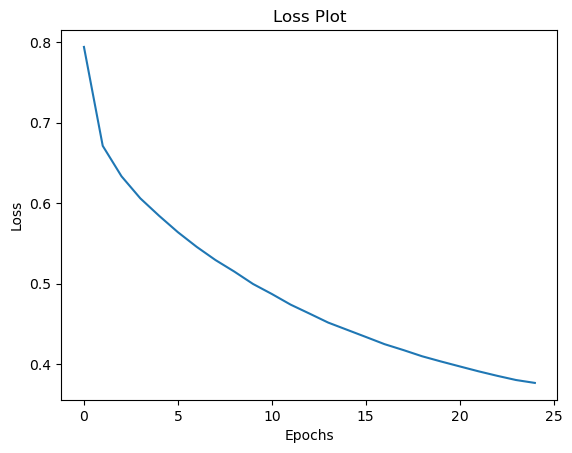

In [23]:
EPOCHS = 25

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0
    
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(
              epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
    # sauvegarde de la perte
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
        ckpt_manager.save()

    print ('Epoch {} Loss {:.6f}'.format(epoch + 1,
                                         total_loss/num_steps))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))

# Affichage de la courbe d'entrainement
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

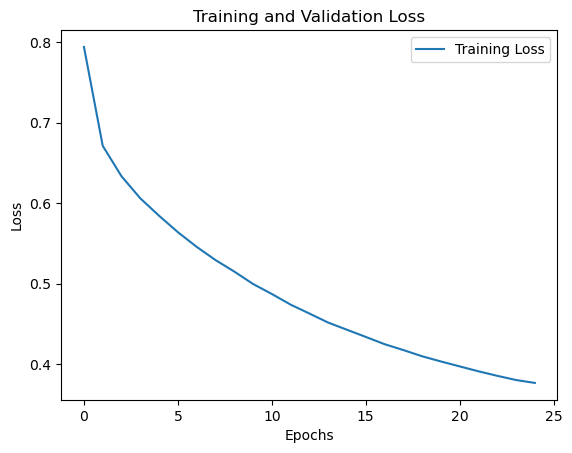

In [50]:
# Affichage de la courbe d'entraînement
plt.plot(loss_plot, label='Training Loss')
if 'val_loss_plot' in globals():  # Vérifie si val_loss_plot existe
    plt.plot(val_loss_plot, label='Validation Loss', linestyle='--')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()



## Calculer Accuracy

In [51]:
def calculate_accuracy(soutenance_images, soutenance_annotations):
    correct_predictions = 0
    total_predictions = len(soutenance_images)

    for image_path in soutenance_images:
        clean_name = clean_filename(os.path.basename(image_path))
        if clean_name not in soutenance_annotations:
            continue

        real_caption = soutenance_annotations[clean_name]
        result, _ = evaluate(image_path)
        predicted_caption = ' '.join(result)

        # Simple word-overlap matching
        real_words = set(real_caption.lower().split())
        predicted_words = set(predicted_caption.lower().split())
        overlap = len(real_words & predicted_words)

        if overlap > 0:
            correct_predictions += 1

    accuracy = correct_predictions / total_predictions * 100
    print(f"Validation Accuracy: {accuracy:.2f}%")
    return accuracy

# Calculer l'accuracy
accuracy = calculate_accuracy(soutenance_images, soutenance_annotations)


Validation Accuracy: 93.75%


## Fonction pour calculer le Blue Score

In [52]:
from nltk.translate.bleu_score import sentence_bleu

def calculate_bleu_score(soutenance_images, soutenance_annotations):
    bleu_scores = []

    for image_path in soutenance_images:
        clean_name = clean_filename(os.path.basename(image_path))
        if clean_name not in soutenance_annotations:
            continue

        real_caption = soutenance_annotations[clean_name]
        result, _ = evaluate(image_path)
        predicted_caption = ' '.join(result)

        # BLEU Score Calculation
        reference = [real_caption.lower().split()]  # Ground truth
        candidate = predicted_caption.lower().split()  # Predicted
        score = sentence_bleu(reference, candidate, weights=(0.5, 0.5))
        bleu_scores.append(score)

    avg_bleu = sum(bleu_scores) / len(bleu_scores) if bleu_scores else 0
    print(f"Average BLEU Score: {avg_bleu:.4f}")
    return avg_bleu

# Calculer le BLEU Score
bleu_score = calculate_bleu_score(soutenance_images, soutenance_annotations)


C:\Users\Legion 7 Pro\anaconda3\Lib\site-packages\nltk\translate\bleu_score.py:577: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


Average BLEU Score: 0.0434


## Blue Score avec lissage

In [53]:
from nltk.translate.bleu_score import SmoothingFunction

def calculate_bleu_score_with_smoothing(soutenance_images, soutenance_annotations):
    smoothie = SmoothingFunction().method1
    bleu_scores = []

    for image_path in soutenance_images:
        clean_name = clean_filename(os.path.basename(image_path))
        if clean_name not in soutenance_annotations:
            continue

        real_caption = soutenance_annotations[clean_name]
        result, _ = evaluate(image_path)
        predicted_caption = ' '.join(result)

        # BLEU Score Calculation with Smoothing
        reference = [real_caption.lower().split()]  # Ground truth
        candidate = predicted_caption.lower().split()  # Predicted
        score = sentence_bleu(reference, candidate, smoothing_function=smoothie, weights=(0.5, 0.5))
        bleu_scores.append(score)

    avg_bleu = sum(bleu_scores) / len(bleu_scores) if bleu_scores else 0
    print(f"Average BLEU Score with Smoothing: {avg_bleu:.4f}")
    return avg_bleu

# Calculate BLEU score with smoothing
calculate_bleu_score_with_smoothing(soutenance_images, soutenance_annotations)


Average BLEU Score with Smoothing: 0.0715


0.07147071170590949

## Sample predictions 

Image: photo13.jpg
Real Caption: It must be exciting to ride on a two tier bus.
Predicted Caption: a double decker bus traveling down the street <end>


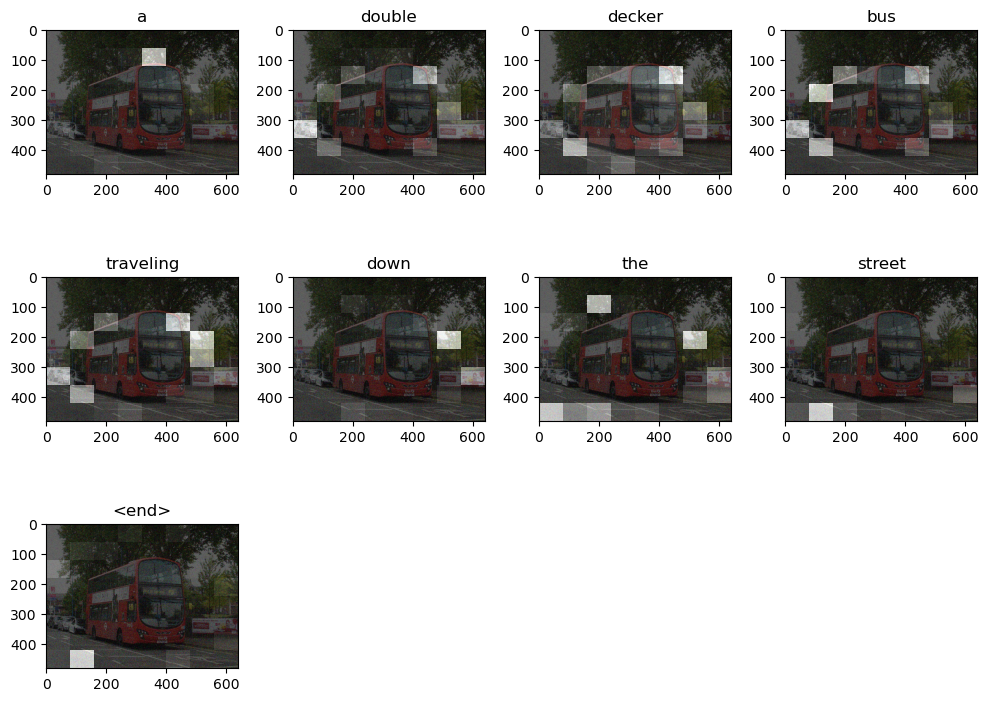

Image: photo7.jpg
Real Caption: The man is hitting the baseball during the game.
Predicted Caption: a baseball player that workers <end>


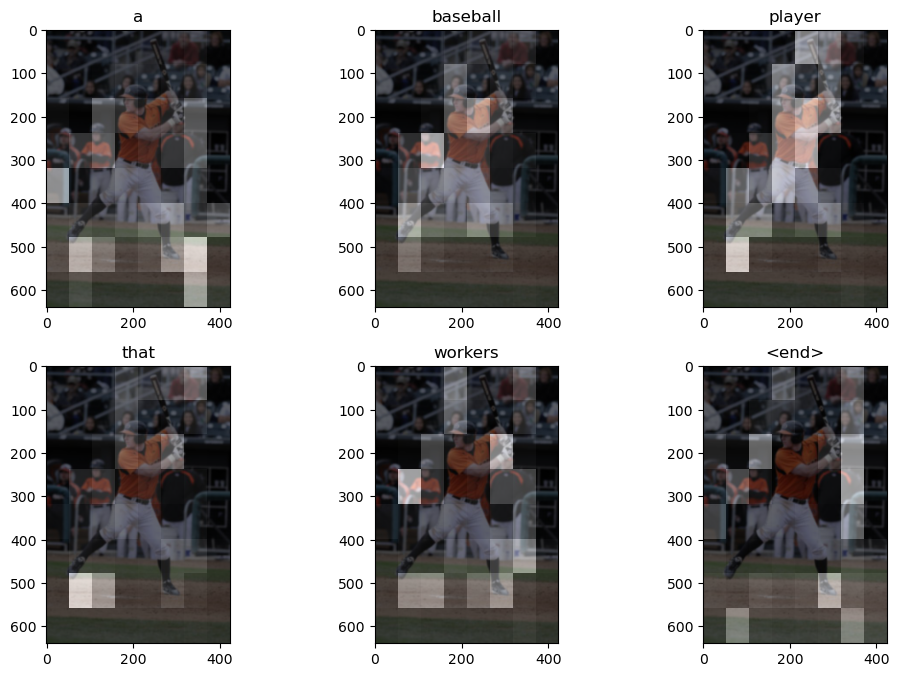

Image: photo2.jpg
Real Caption: A plane flying in the sky on a slightly cloudy day.
Predicted Caption: a large commercial plane flying in cloudy sky <end>


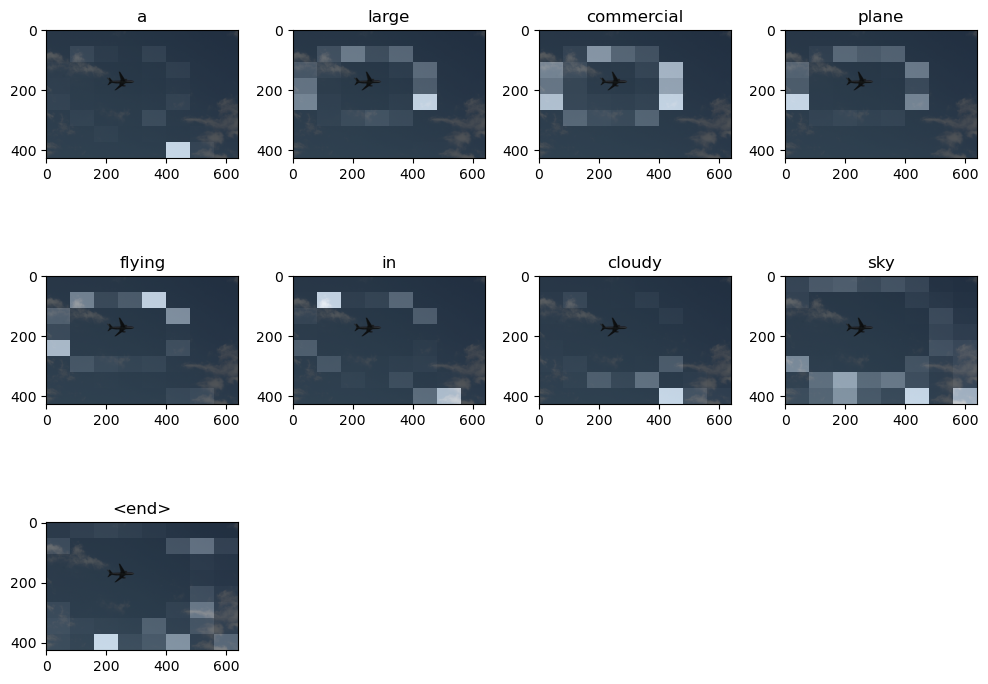

Image: photo6.jpg
Real Caption: A young man in a slip ties is shown.
Predicted Caption: a man <unk> picture while the day <end>


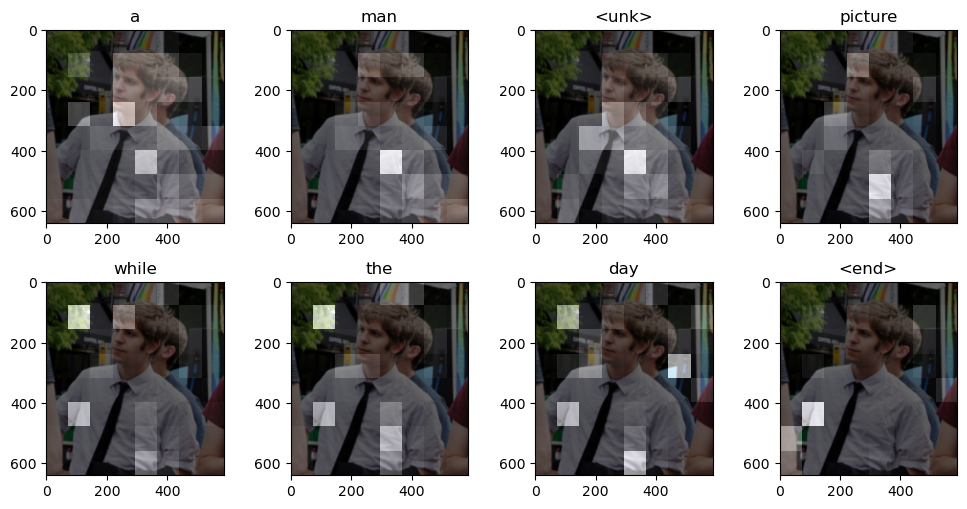

Image: photo9.jpg
Real Caption: Two people on a grassy field flying kites.
Predicted Caption: a man holds his plane with bushes and forest <end>


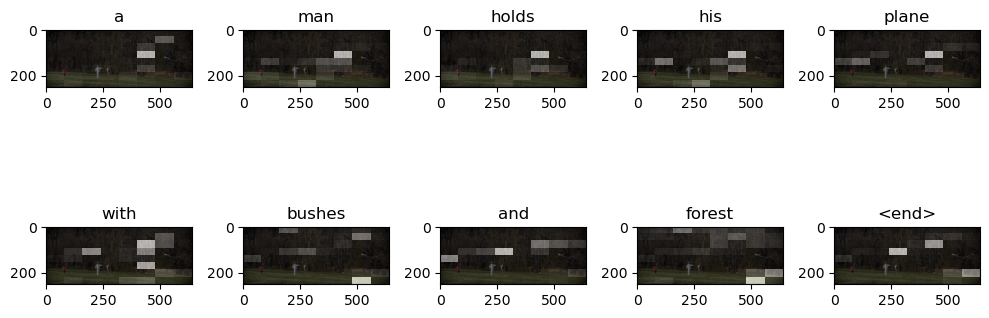

In [54]:
def sample_predictions(soutenance_images, soutenance_annotations, num_samples=5):
    sampled_images = random.sample(soutenance_images, num_samples)

    for image_path in sampled_images:
        clean_name = clean_filename(os.path.basename(image_path))
        if clean_name not in soutenance_annotations:
            continue

        real_caption = soutenance_annotations[clean_name]
        result, attention_plot = evaluate(image_path)
        predicted_caption = ' '.join(result)

        print(f"Image: {clean_name}")
        print(f"Real Caption: {real_caption}")
        print(f"Predicted Caption: {predicted_caption}")
        plot_attention(image_path, result, attention_plot)

# Visualize predictions for 5 random samples
sample_predictions(soutenance_images, soutenance_annotations, num_samples=5)


# 3.2 Test
La fonction qui permet d'achever une étape d'evaluation pour le test est dans la cellule suivante. 

In [29]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

# Fonction permettant la représentation de l'attention au niveau de l'image
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

L'affichage de quelques exemples sur le résultat retourné par l'évaluation. 

Real Caption: <start> a alley way crowded with pedestrian and vehicle traffic <end>
Prediction Caption: a street on to a woman <end>


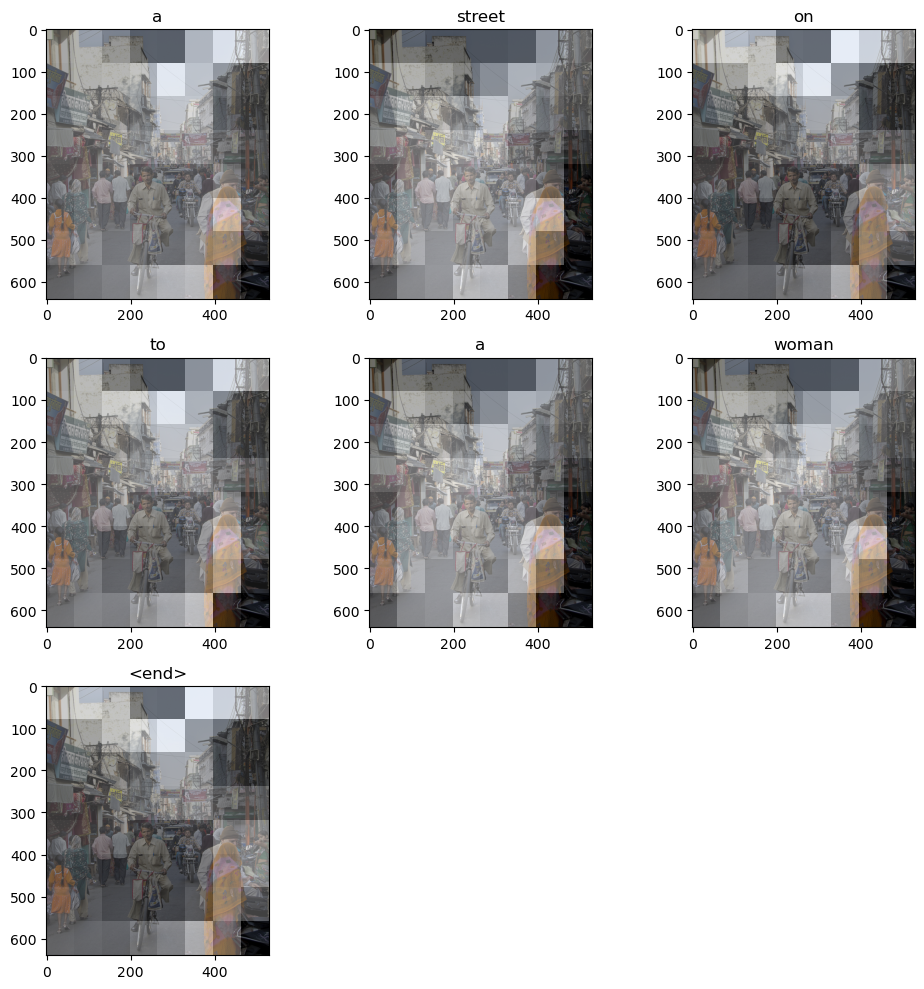

In [36]:
# Affichage de quelques annotations dans le jeu de test
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print ('Real Caption:', real_caption)
print ('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)

## Data Cleaning pour le dataset de soutenance 

In [48]:
# Chemin du fichier captioning.txt
captioning_file = "D:/Dataset soutenance/Dataset soutenance/captioning.txt"

# Fonction pour nettoyer les noms de fichiers (supprimer les espaces supplémentaires et normaliser)
def clean_filename(filename):
    return filename.strip().lower().replace(" ", "").replace("(", "").replace(")", "")

# Charger les annotations depuis le fichier captioning.txt
soutenance_annotations = {}
with open(captioning_file, "r") as file:
    for line in file:
        parts = line.strip().split(" : ")
        if len(parts) == 2:
            file_name = clean_filename(parts[0].strip())  # Normaliser les noms
            soutenance_annotations[file_name] = parts[1].strip()

# Vérifiez les annotations chargées
print("Annotations chargées pour Dataset soutenance:")
for key, value in soutenance_annotations.items():
    print(f"{key}: {value}")


Annotations chargées pour Dataset soutenance:
photo1.jpg: a white dog sitting in a black chair
photo2.jpg: A plane flying in the sky on a slightly cloudy day.
photo3.jpg: Cat making a funny face with a bowl filled with something in front of it.
photo4.jpg: A computer mouse sitting next to a computer keyboard.
photo5.jpg: A giraffe sticking its tongue out with trees in the background.
photo6.jpg: A young man in a slip ties is shown.
photo7.jpg: The man is hitting the baseball during the game.
photo8.jpg: A small cat is curled up, sleeping inside of a baseball cap.
photo9.jpg: Two people on a grassy field flying kites.
photo10.jpg: A man standing in the midst of cattle on a dirt field.
photo11.jpg: A baseball player on the pitchers mound throwing a baseball.
photo12.jpg: A bed with a blue blanket sitting next to a blue lamp.
photo13.jpg: It must be exciting to ride on a two tier bus.
photo14.jpg: The man is holding an umbrella over his shoulder.
photo15.jpg: A zebra that is standing in t


--- Résultats pour le Dataset Soutenance ---

Image: photo1.jpg
Real Caption: a white dog sitting in a black chair
Predicted Caption: a hospital table with a white and white cat <end>


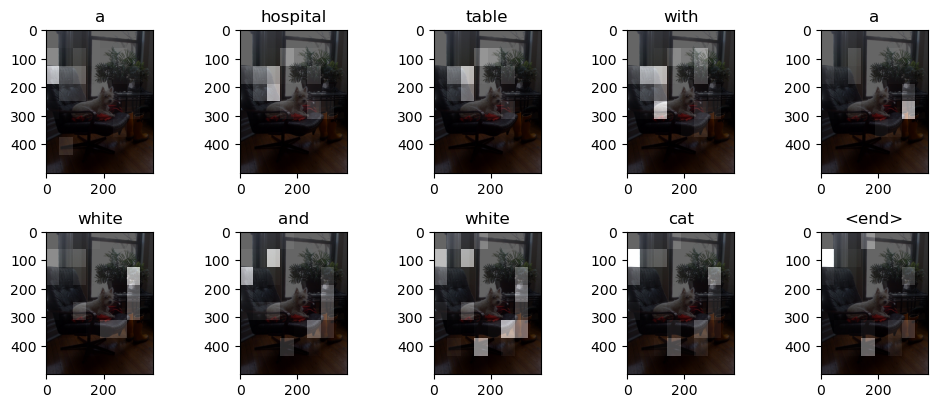

Image: photo10.jpg
Real Caption: A man standing in the midst of cattle on a dirt field.
Predicted Caption: a black and white photo of a cow on a grassy field <end>


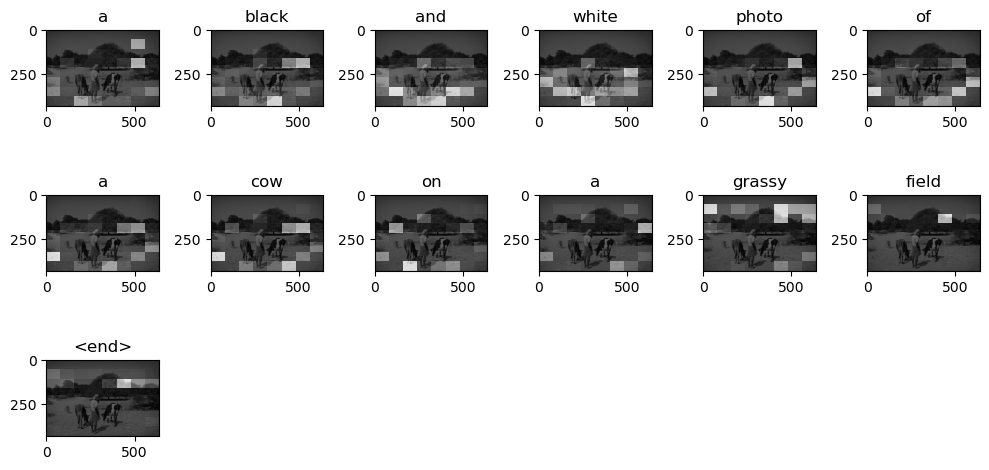

Image: photo11.jpg
Real Caption: A baseball player on the pitchers mound throwing a baseball.
Predicted Caption: a man is holding a baseball and holding a baseball while ball <end>


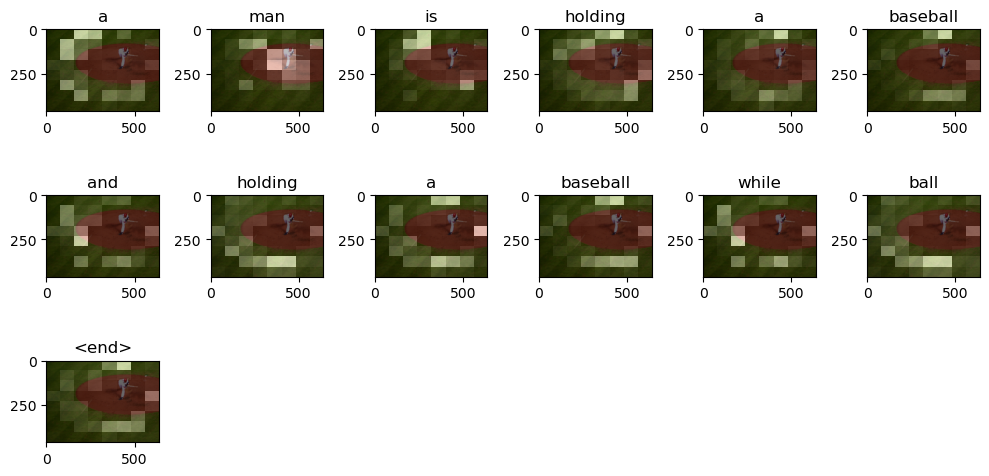

Image: photo12.jpg
Real Caption: A bed with a blue blanket sitting next to a blue lamp.
Predicted Caption: a a bed with brown cat sitting on a multicolored blanket <end>


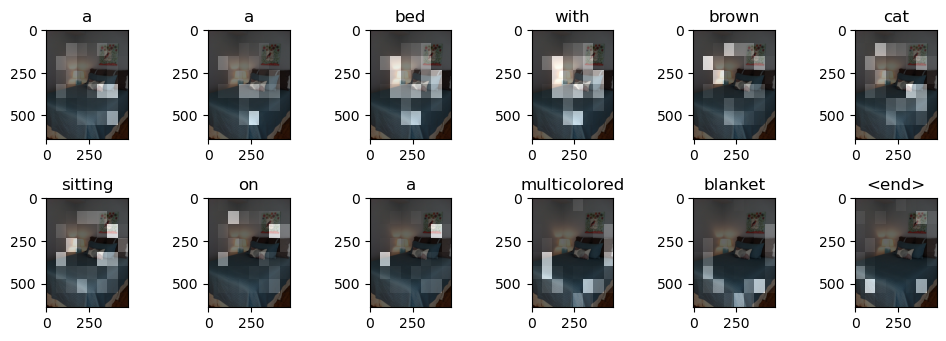

Image: photo13.jpg
Real Caption: It must be exciting to ride on a two tier bus.
Predicted Caption: a front end of people coming up people reading <unk> somewhere <end>


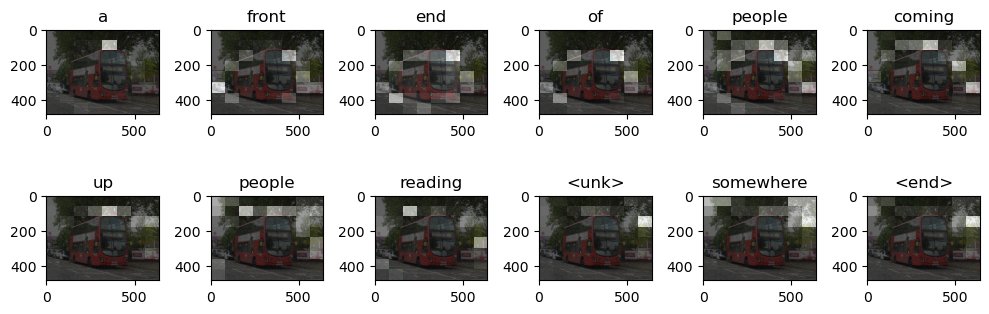

Image: photo14.jpg
Real Caption: The man is holding an umbrella over his shoulder.
Predicted Caption: a couple of pots are having an asian characters in front a store near an metal metal rail <end>


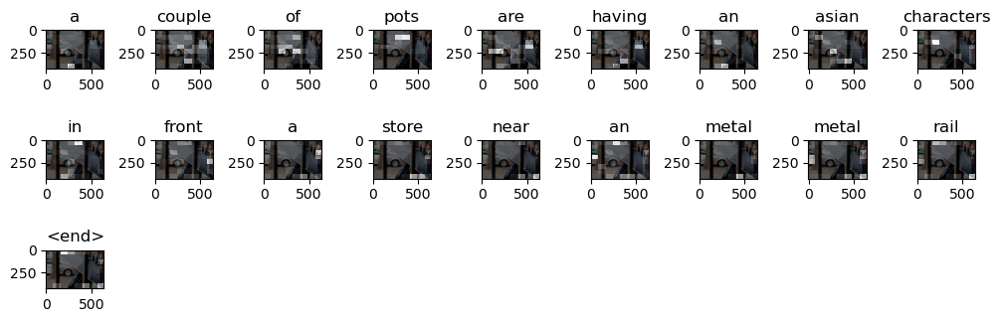

Image: photo15.jpg
Real Caption: A zebra that is standing in the grass.
Predicted Caption: two zebras are standing in a parking lot <end>


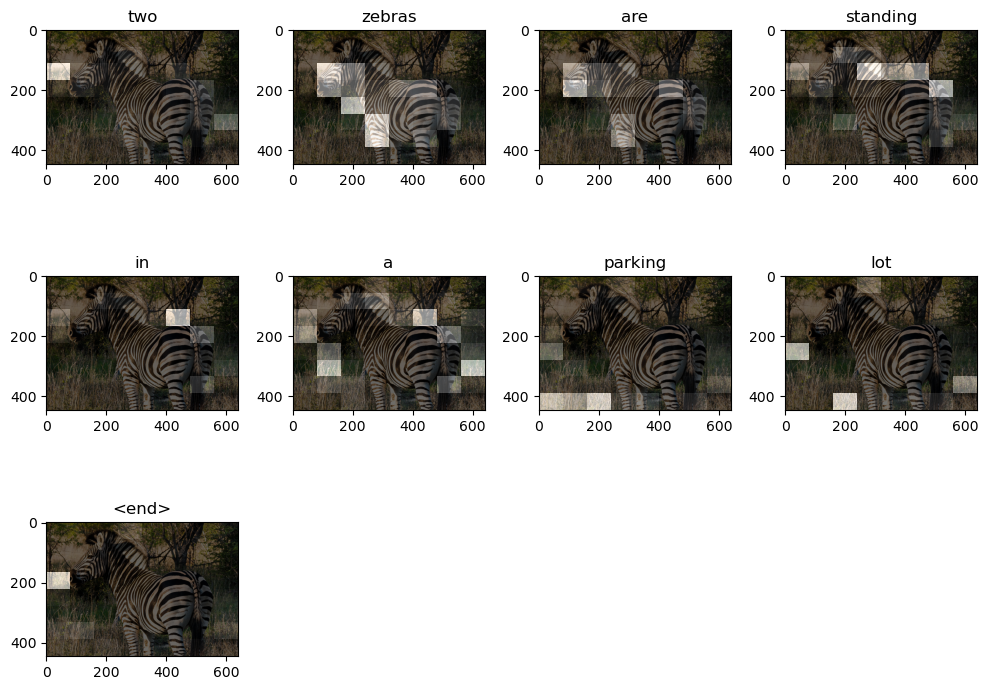

Image: photo16.jpg
Real Caption: a train on a track near many trees
Predicted Caption: a train traveling past some tracks <end>


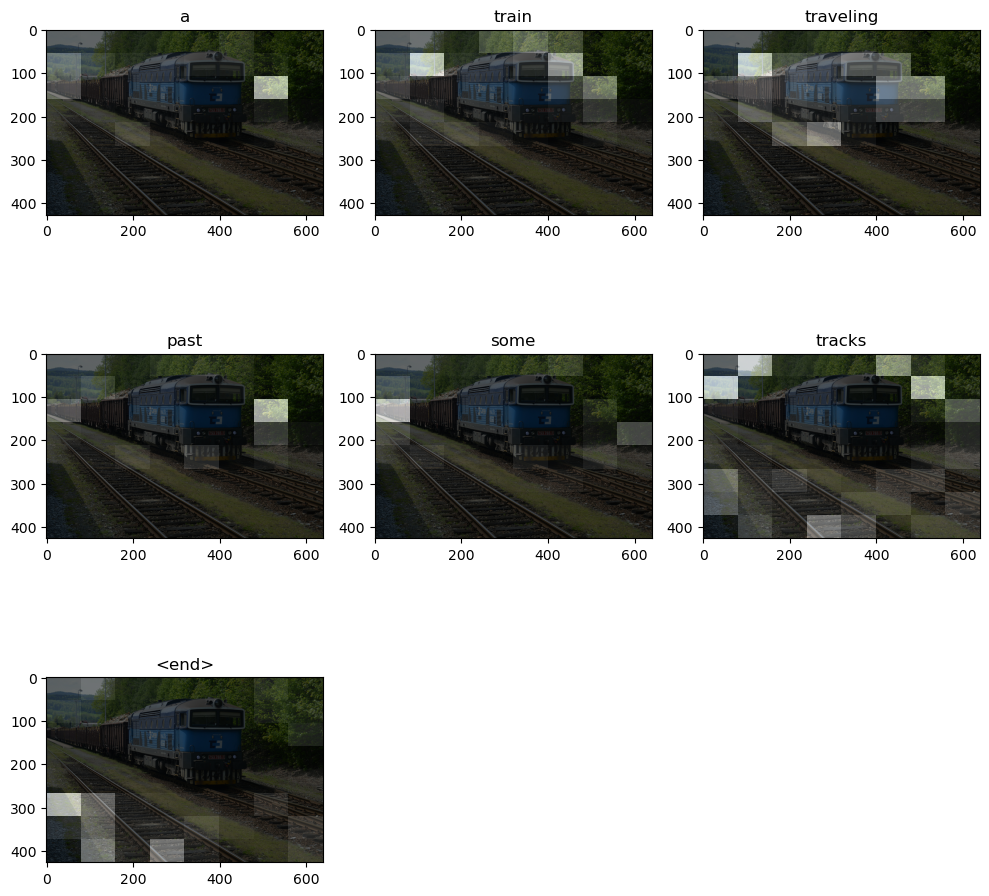

Image: photo2.jpg
Real Caption: A plane flying in the sky on a slightly cloudy day.
Predicted Caption: a plane flying over top of a clear blue sky with a blue sky with blue flowers <end>


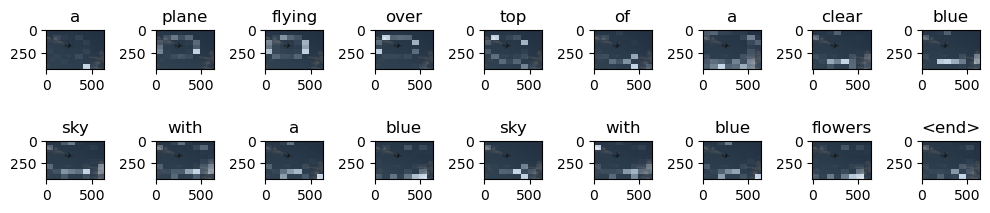

Image: photo3.jpg
Real Caption: Cat making a funny face with a bowl filled with something in front of it.
Predicted Caption: a tabby cat is feeding on a white cat <end>


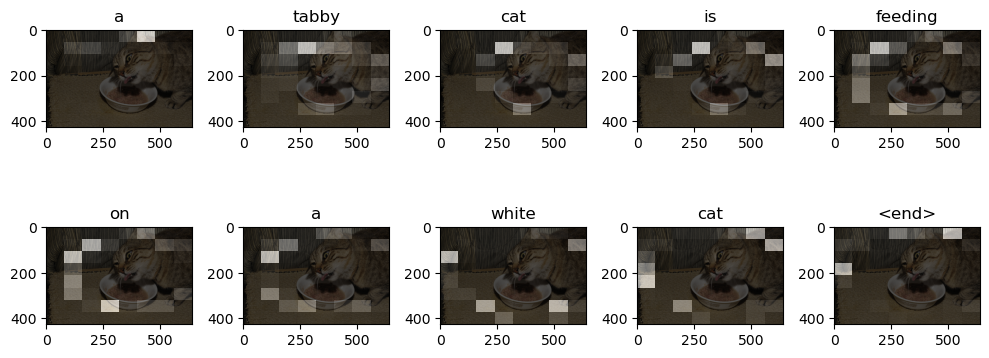

Image: photo4.jpg
Real Caption: A computer mouse sitting next to a computer keyboard.
Predicted Caption: an open office items that are placed on a lamp <end>


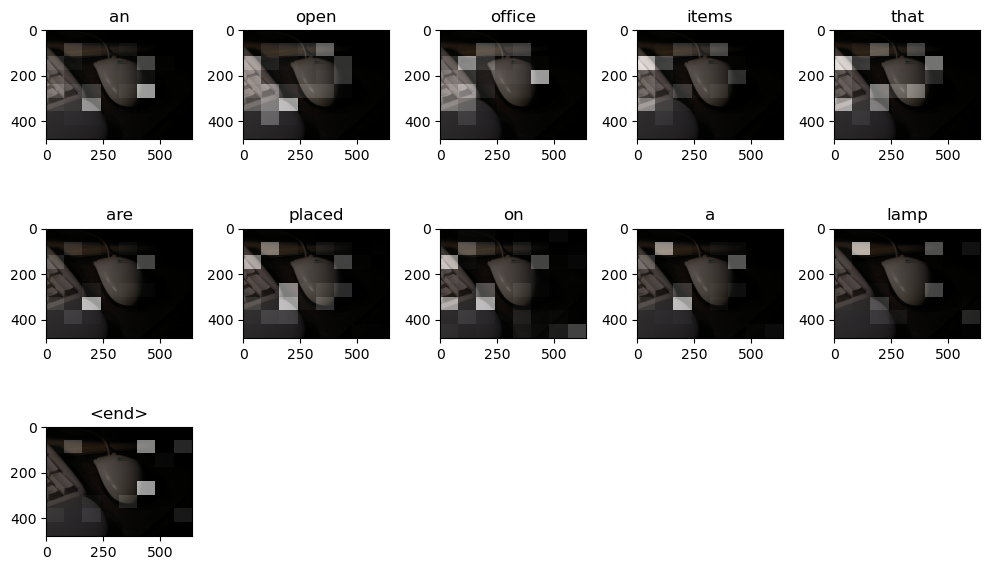

Image: photo5.jpg
Real Caption: A giraffe sticking its tongue out with trees in the background.
Predicted Caption: a young boy feeds a wild sheep eating from a tree at something on eating from behind a tree <end>


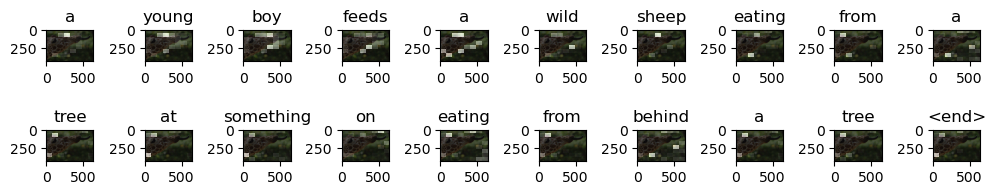

Image: photo6.jpg
Real Caption: A young man in a slip ties is shown.
Predicted Caption: a man looking at her neck while wearing a piece of her phone <end>


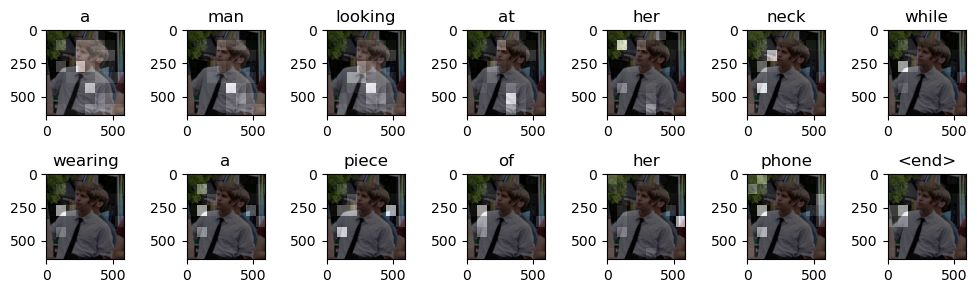

Image: photo7.jpg
Real Caption: The man is hitting the baseball during the game.
Predicted Caption: a baseball player at the <unk> game <end>


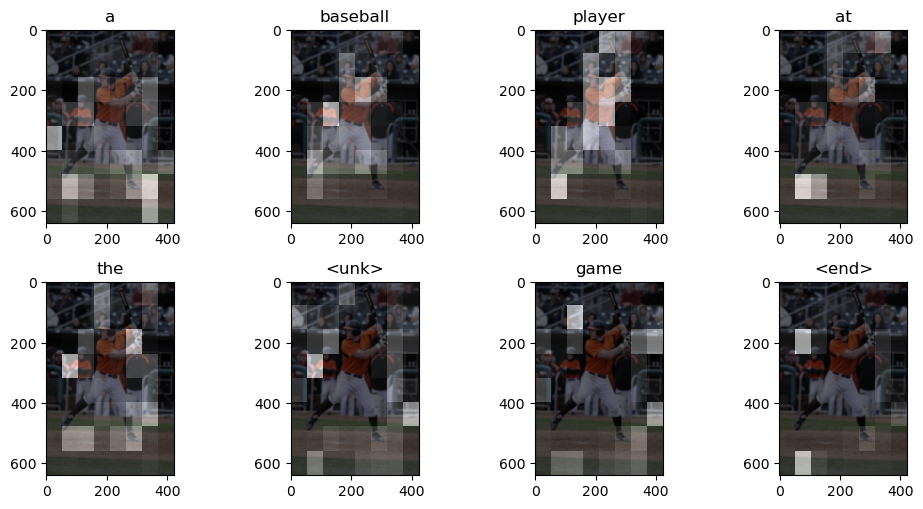

Image: photo8.jpg
Real Caption: A small cat is curled up, sleeping inside of a baseball cap.
Predicted Caption: a kitten curled up officer holding it's head <end>


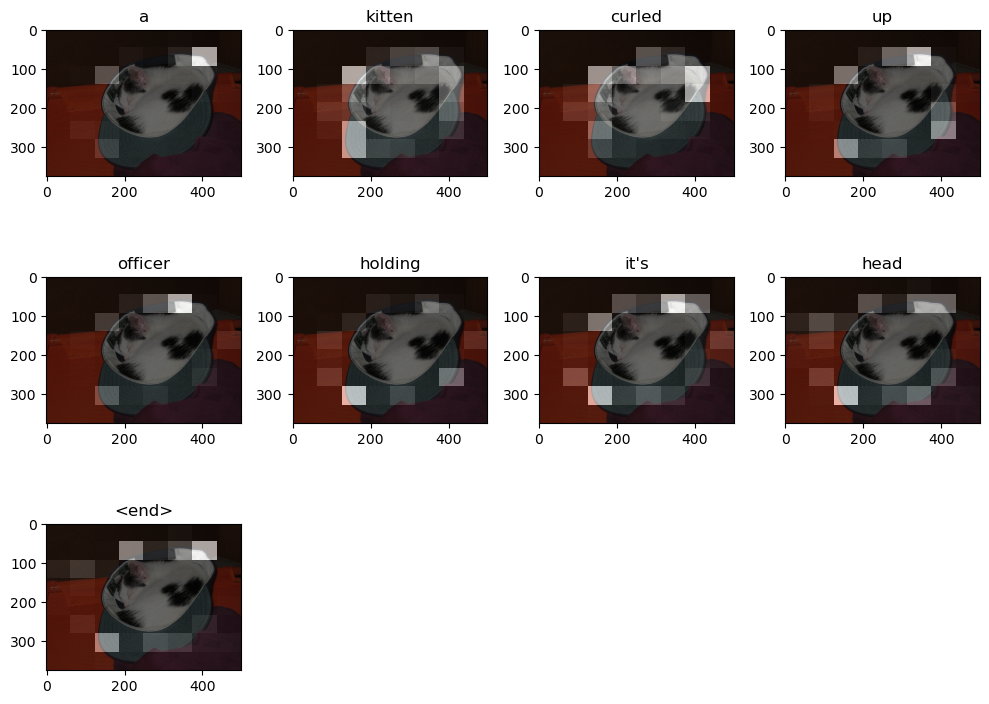

Image: photo9.jpg
Real Caption: Two people on a grassy field flying kites.
Predicted Caption: a lady in the wind in the woods <end>


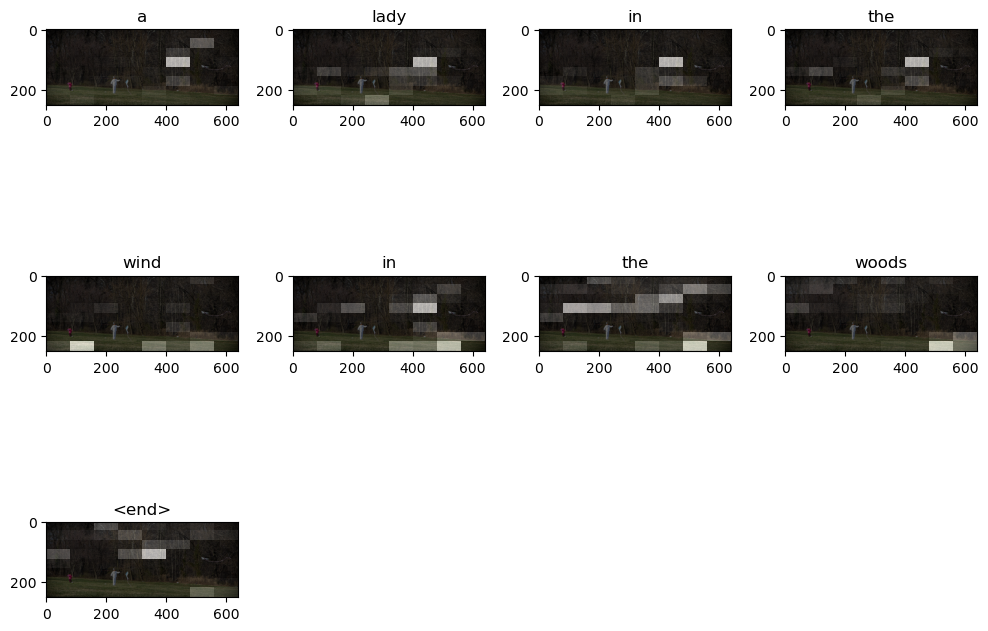

In [49]:
import glob
import os

# Spécifiez le chemin du dossier "Dataset soutenance"
soutenance_folder = "D:/Dataset soutenance/Dataset soutenance"

# Charger toutes les images dans le dossier
soutenance_images = glob.glob(soutenance_folder + "/*.jpg")  # Ajustez si les images ont une autre extension

# Fonction pour tester et comparer avec les annotations
def test_soutenance_dataset(soutenance_images, soutenance_annotations):
    print("\n--- Résultats pour le Dataset Soutenance ---\n")
    for image_path in soutenance_images:
        # Prétraitement et normalisation du nom de l'image
        clean_name = clean_filename(os.path.basename(image_path))
        
        # Vérifier si une annotation existe pour l'image
        if clean_name not in soutenance_annotations:
            print(f"Aucune annotation pour l'image {clean_name}")
            continue

        # Faire la prédiction
        result, attention_plot = evaluate(image_path)

        # Afficher les résultats
        real_caption = soutenance_annotations[clean_name]
        predicted_caption = ' '.join(result)

        print(f"Image: {clean_name}")
        print(f"Real Caption: {real_caption}")
        print(f"Predicted Caption: {predicted_caption}")
        plot_attention(image_path, result, attention_plot)

# Appeler la fonction pour tester
test_soutenance_dataset(soutenance_images, soutenance_annotations)



--- Résultats pour le Dataset Soutenance ---

Image: photo1.jpg
Real Caption: a white dog sitting in a black chair
Predicted Caption: a room that is sitting by a small dog is looking up toward a window <end>


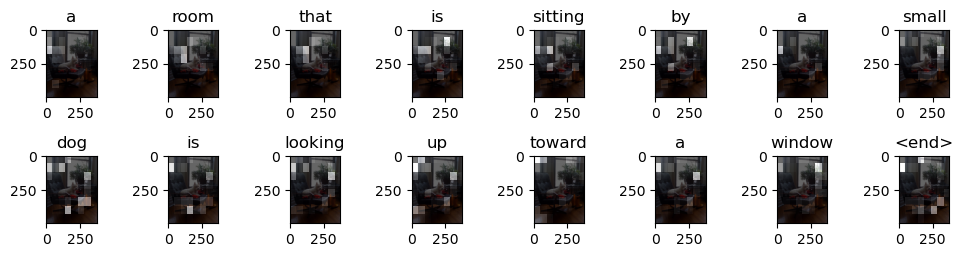

Image: photo10.jpg
Real Caption: A man standing in the midst of cattle on a dirt field.
Predicted Caption: a person petting a herd cows beside a fence and bushes <end>


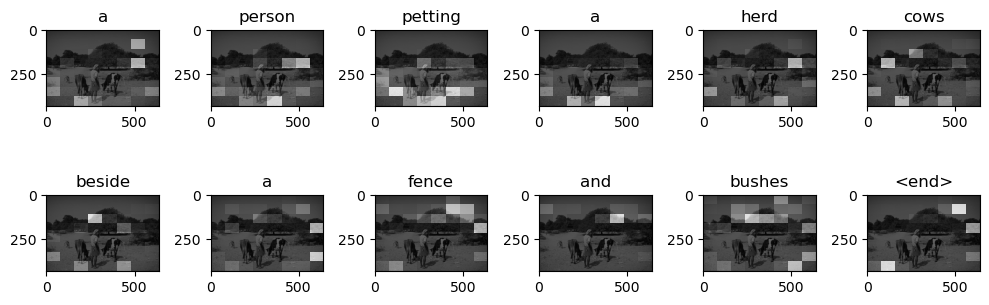

Image: photo11.jpg
Real Caption: A baseball player on the pitchers mound throwing a baseball.
Predicted Caption: a man is holding a baseball with a baseball in the <unk> <end>


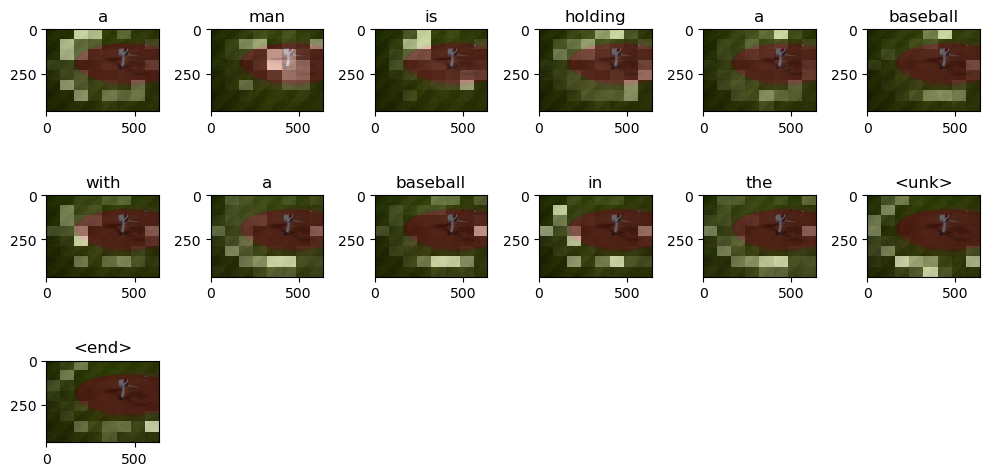

Image: photo12.jpg
Real Caption: A bed with a blue blanket sitting next to a blue lamp.
Predicted Caption: a bed is sitting on a multicolored blanket <end>


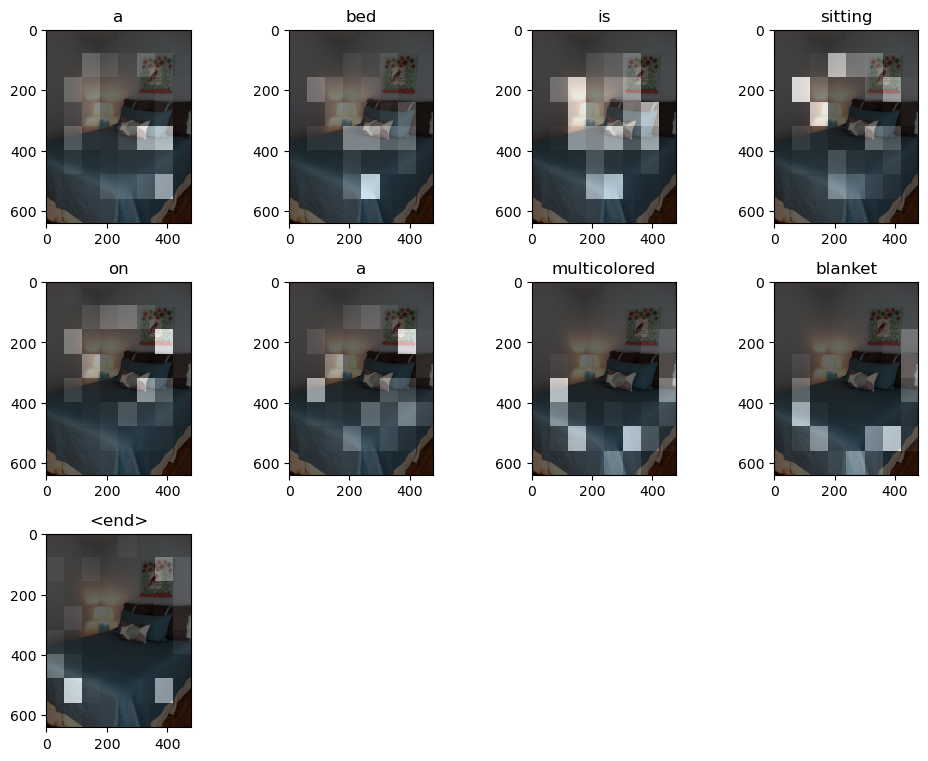

Image: photo13.jpg
Real Caption: It must be exciting to ride on a two tier bus.
Predicted Caption: a red double decker bus is going down the road during the snow <end>


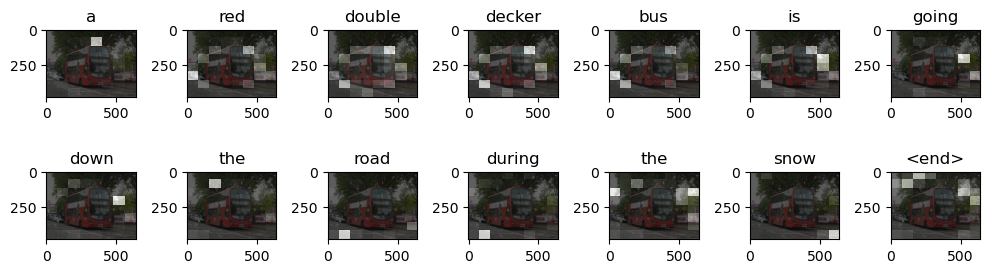

Image: photo14.jpg
Real Caption: The man is holding an umbrella over his shoulder.
Predicted Caption: a picture of the face of a street sign <end>


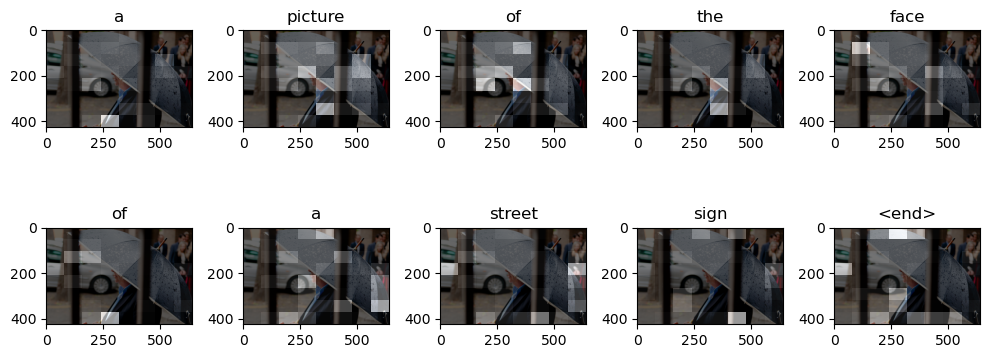

Image: photo15.jpg
Real Caption: A zebra that is standing in the grass.
Predicted Caption: a couple of zebras are standing together <end>


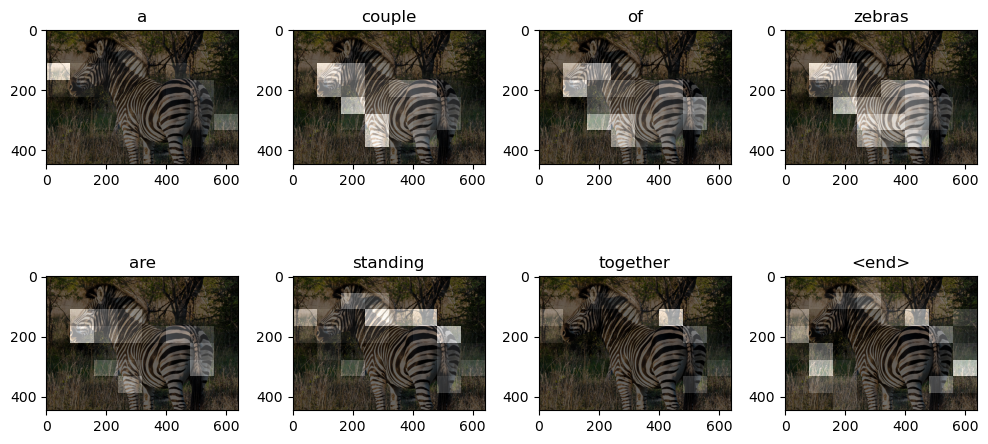

Image: photo16.jpg
Real Caption: a train on a track near many trees
Predicted Caption: a train traveling down tracks by the train tracks adjacent to more passengers in the station <end>


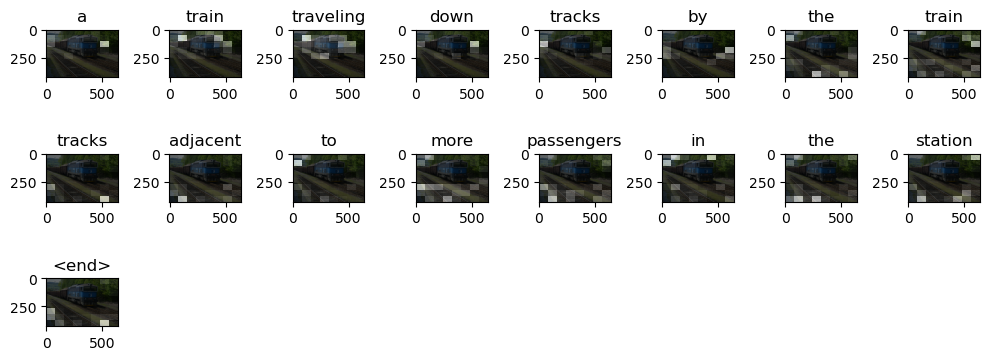

Image: photo2.jpg
Real Caption: A plane flying in the sky on a slightly cloudy day.
Predicted Caption: top of a landscape flying outside of the blue sky above the sky <end>


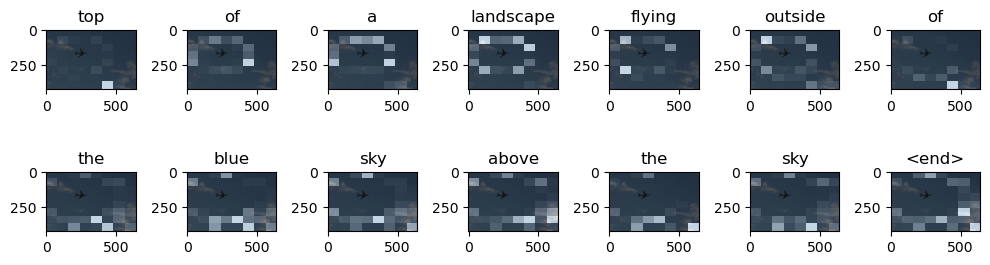

Image: photo3.jpg
Real Caption: Cat making a funny face with a bowl filled with something in front of it.
Predicted Caption: the cat wearing a dark colored cat on a glass bowl <end>


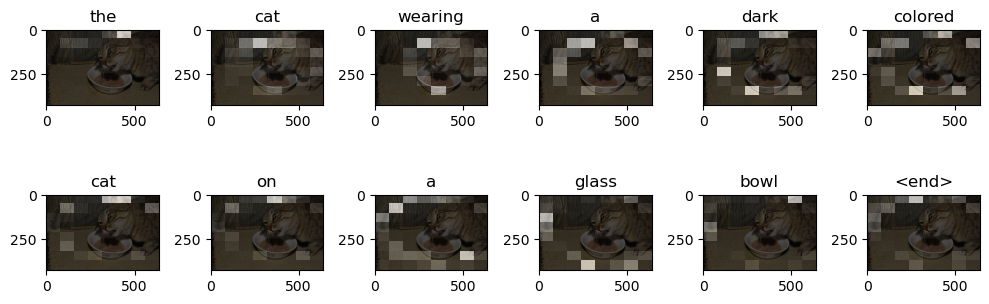

Image: photo4.jpg
Real Caption: A computer mouse sitting next to a computer keyboard.
Predicted Caption: an open office items on and a lamp <end>


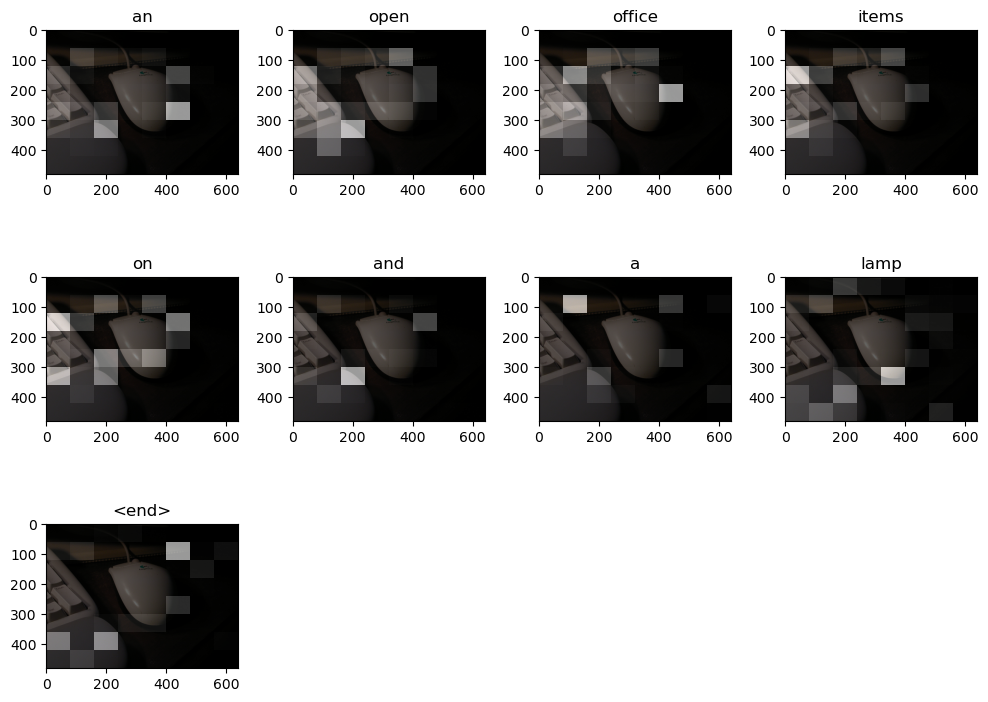

Image: photo5.jpg
Real Caption: A giraffe sticking its tongue out with trees in the background.
Predicted Caption: a boy feeding on a lush green forest <end>


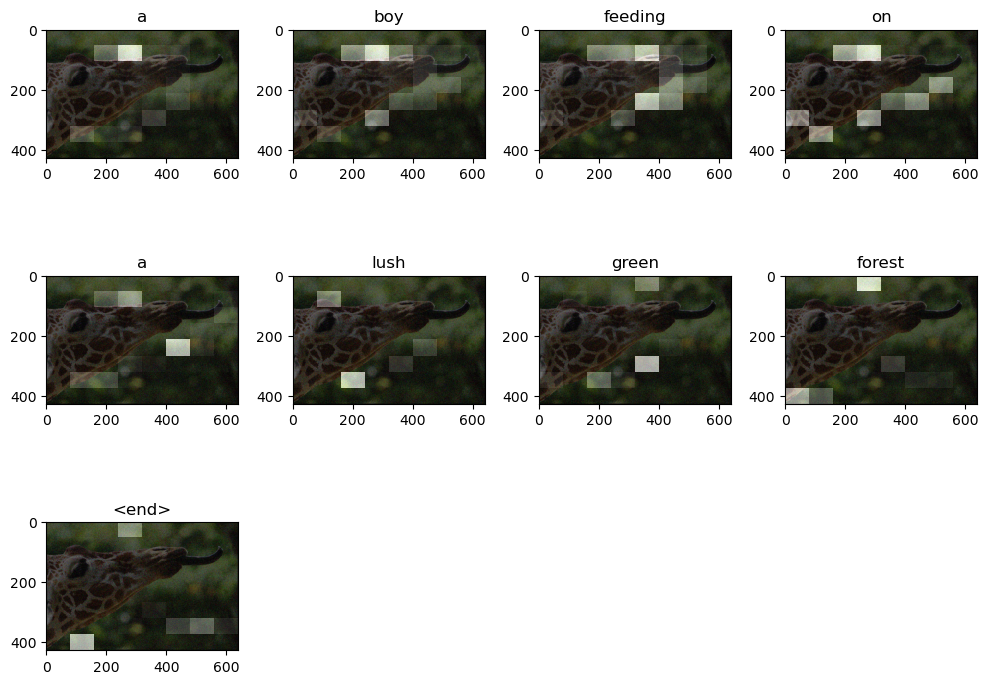

Image: photo6.jpg
Real Caption: A young man in a slip ties is shown.
Predicted Caption: the women doing a woman in a train while standing near a train <end>


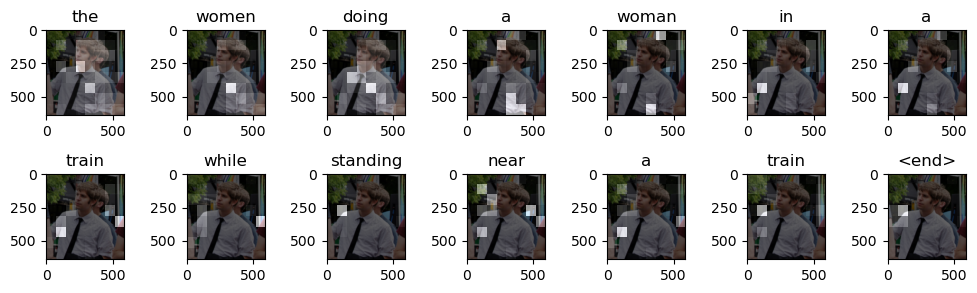

Image: photo7.jpg
Real Caption: The man is hitting the baseball during the game.
Predicted Caption: a baseball player with other people playing the ball during the show <end>


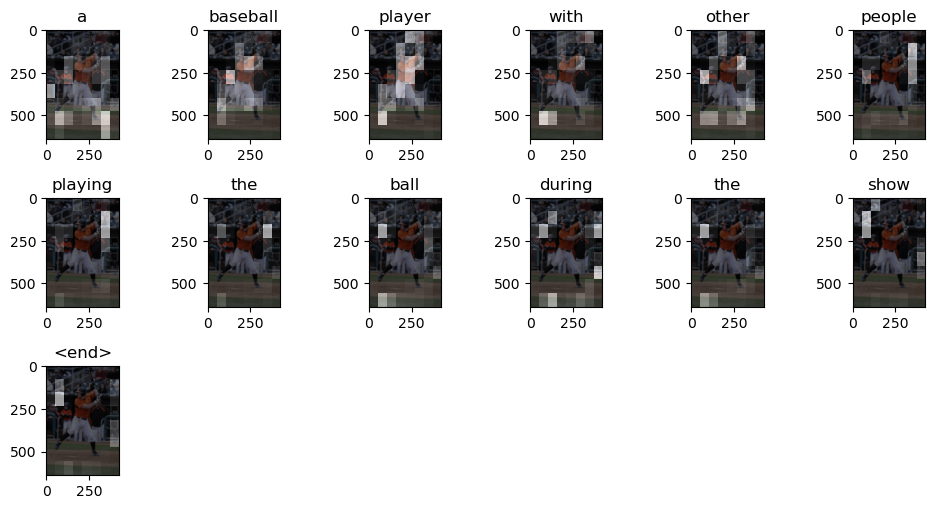

Image: photo8.jpg
Real Caption: A small cat is curled up, sleeping inside of a baseball cap.
Predicted Caption: a cat that is sleeping on a bed <end>


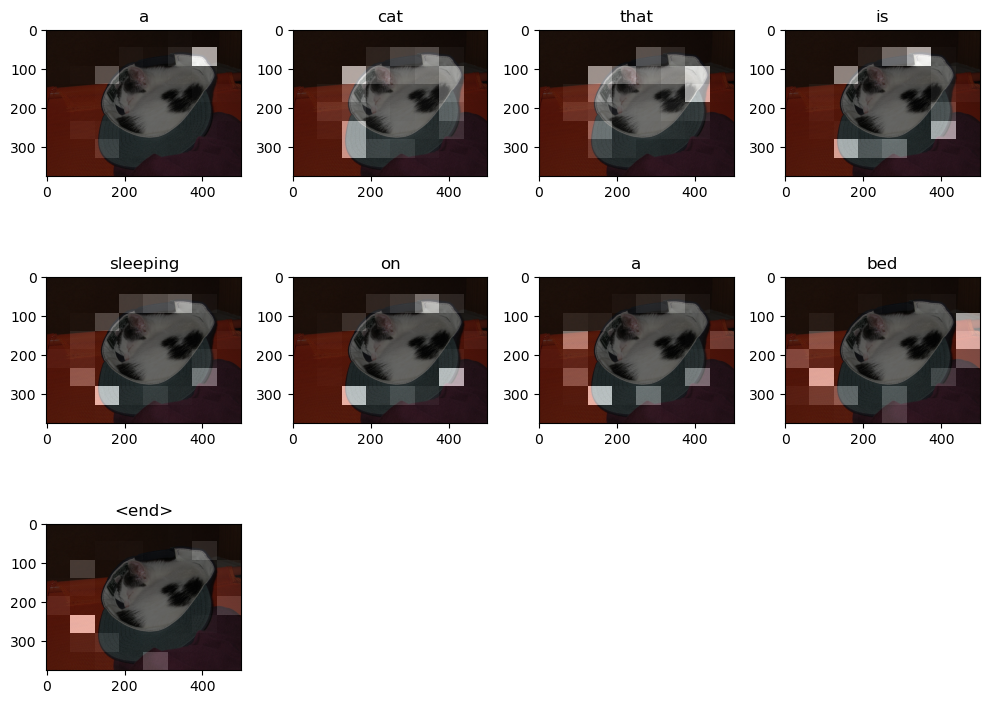

Image: photo9.jpg
Real Caption: Two people on a grassy field flying kites.
Predicted Caption: a man in the wind in the woods with a sky behind it <end>


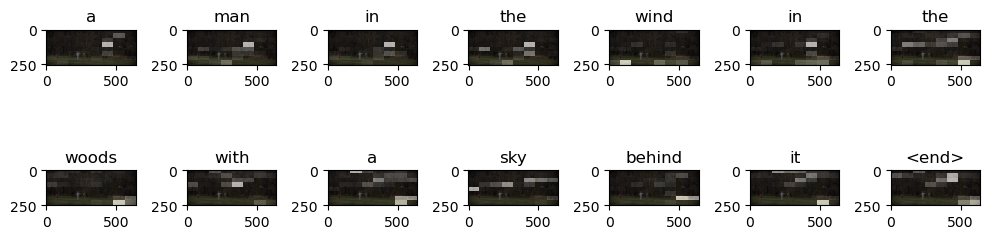

Validation Accuracy: 100.00%
Average BLEU Score with Smoothing: 0.0764


In [55]:
# Call the function to test the soutenance dataset
test_soutenance_dataset(soutenance_images, soutenance_annotations)

# Calculate Validation Accuracy
accuracy = calculate_accuracy(soutenance_images, soutenance_annotations)

# Calculate BLEU Score with Smoothing
bleu_score = calculate_bleu_score_with_smoothing(soutenance_images, soutenance_annotations)


Image: photo4.jpg
Real Caption: A computer mouse sitting next to a computer keyboard.
Predicted Caption: bowl with a cellphone mounted on top of a lamp and kitchen sinks <end>


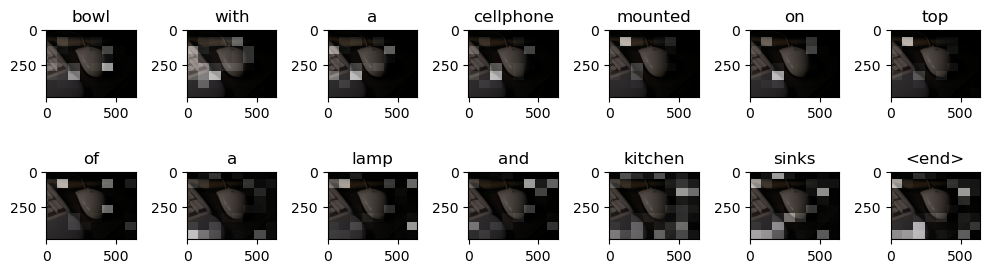

Image: photo10.jpg
Real Caption: A man standing in the midst of cattle on a dirt field.
Predicted Caption: black and white photo of cows next to the fence <end>


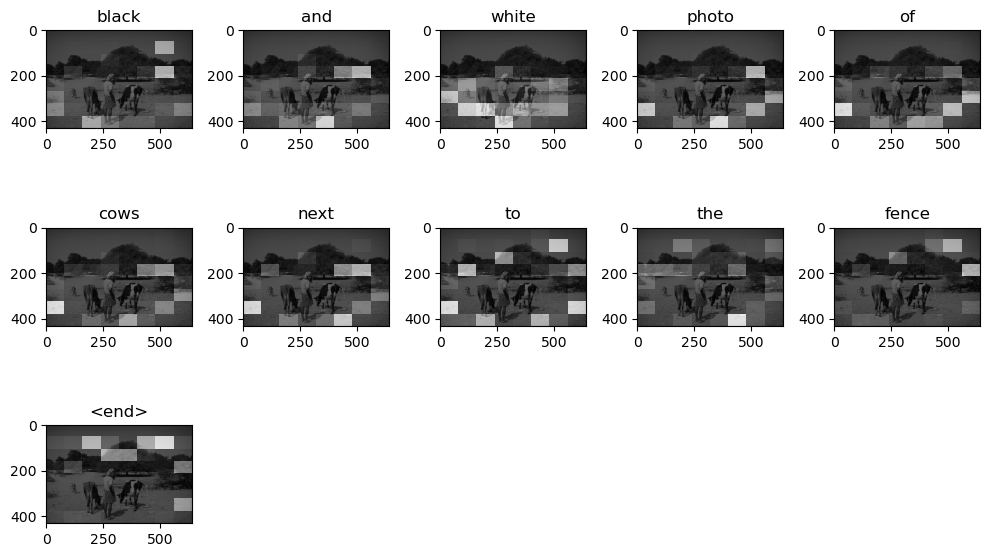

Image: photo14.jpg
Real Caption: The man is holding an umbrella over his shoulder.
Predicted Caption: a picture of a cat that a head <unk> <unk> in a building <end>


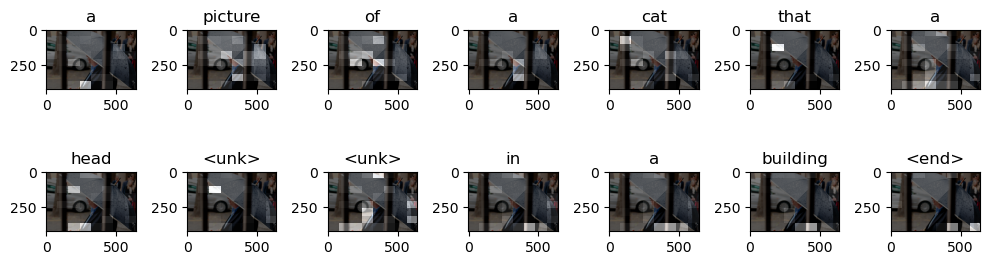

Image: photo8.jpg
Real Caption: A small cat is curled up, sleeping inside of a baseball cap.
Predicted Caption: a cat curled up while holding it's head and small cat on its head <end>


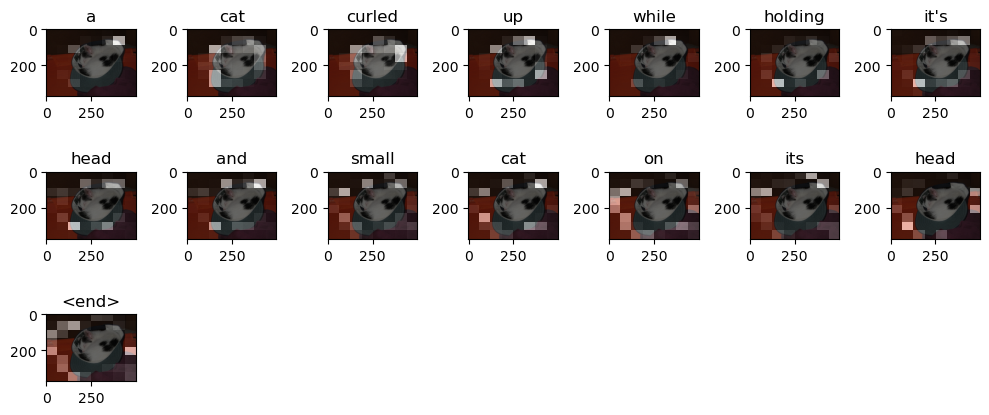

Image: photo16.jpg
Real Caption: a train on a track near many trees
Predicted Caption: two trains traveling down some tracks adjacent to more passengers <end>


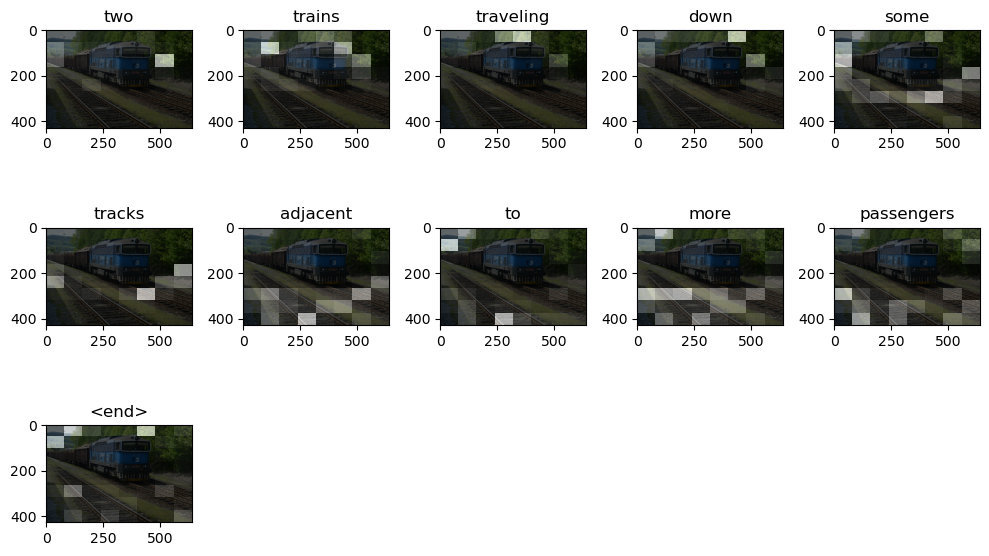

In [56]:
# Visualize predictions for a few random samples
sample_predictions(soutenance_images, soutenance_annotations, num_samples=5)
